In [16]:
import numpy as np
import matplotlib.pyplot as plt
import cvxpy as cp
import gurobipy as gp
from gurobipy import GRB
import matplotlib.patches as patches
from collections import deque
from matplotlib.legend_handler import HandlerTuple
from matplotlib.lines import Line2D
import random

## Import Data and Calculate Variability Bounds

In [2]:
### import network
BB = np.load('SCE56_network.npy')
YY = np.load('SCE56_network_admitance.npy')
num_node = BB.shape[0]

In [3]:
### import data
p_arr = np.load('HICSS_data_p.npy')
q_arr = np.load('HICSS_data_q.npy')

p_pv_arr = np.load('HICSS_data_pvp.npy')
q_pv_arr = np.load('HICSS_data_pvq.npy')

horizon = p_pv_arr.shape[1]

In [4]:
### Calculate the power variability bounds
scale_factor = 1

load_var_upp = 0.6  * scale_factor
load_var_low = 0.6 * scale_factor
pvp_var_upp = 1 * scale_factor
pvq_var_upp = 1 * scale_factor
pvq_var_low = 1.5 * scale_factor

p_load_upp = np.empty(num_node)
p_load_low = np.empty(num_node)
q_load_upp = np.empty(num_node)
q_load_low = np.empty(num_node)

for i in range(num_node):
    p_load_upp[i] = p_arr[i, 0] * (1 + load_var_upp)
    p_load_low[i] = p_arr[i, 0] * (1 - load_var_low)
    if q_arr[i, 0] > 0:
        q_load_upp[i] = q_arr[i, 0] * (1 + load_var_upp)
        q_load_low[i] = q_arr[i, 0] * (1 - load_var_low)
    else: 
        q_load_upp[i] = q_arr[i, 0]
        q_load_low[i] = q_arr[i, 0]

p_pv_upp = np.empty(num_node)
p_pv_low = np.empty(num_node)
q_pv_upp = np.empty(num_node)
q_pv_low = np.empty(num_node)


for i in range(num_node):
    p_pv_upp[i] = p_pv_arr[i, 0] * (1 + pvp_var_upp)
    p_pv_low[i] = p_pv_arr[i, 0] * 0
    q_pv_upp[i] = q_pv_arr[i, 0] * (1 + pvq_var_upp)
    q_pv_low[i] = q_pv_arr[i, 0] * (1 - pvq_var_low)

In [5]:
x1 = np.hstack([(p_pv_low - p_load_upp), (q_pv_low - q_load_upp)])    # lower bound
x2 = np.hstack([(p_pv_upp - p_load_low), (q_pv_upp - q_load_low)])    # upper bound

# Results of Figure 1

## Classification of Voltage Measurements

In [6]:
### Problem set up
# [18, 29] for figure 1 a
# [5, 11] for figure 1 b

node_obs = [18, 29]
num_obs = len(node_obs)
target_node = 40

### extreme voltage shift
vm_low = BB[node_obs] @ x1
vm_high = BB[node_obs] @ x2

print(vm_low + 1)
print(vm_high + 1)

[0.9538521  0.89506813]
[1.04340852 1.11581976]


### Region Characterization

In [7]:
resol = 100

z1 = np.linspace(1 + vm_low[0], 1 + vm_high[0], resol)
z2 = np.linspace(1 + vm_low[1], 1 + vm_high[1], resol)

# data collection
feasible_set = []
num_feasible = 0

safe_set = []
unsafe_set = []
safe_value = []
num_safe = 0


xx = cp.Variable(2 * num_node)

obj1 = cp.Maximize(BB[target_node, :] @ xx + 1)

vm = cp.Parameter(len(node_obs))

constraint = [x1 <= xx]
constraint += [xx <= x2]

constraint += [BB[node_obs[0], :] @ xx + 1 == vm[0]]
constraint += [BB[node_obs[1], :] @ xx + 1 == vm[1]]

problem = cp.Problem(obj1, constraint)

for i in range(resol):
    for j in range(resol):
        vm.value = np.array([z1[i], z2[j]])

        problem.solve(
        solver=cp.GUROBI,
        warm_start=True,
        verbose=False)
        
        vv5 = np.array(problem.value)

        status = problem.status
        #print(status)

        if 'optimal' == status:
            feasible_set.append(np.array([z1[i], z2[j]]))
            num_feasible +=1
            if vv5 <= 1 + 0.05:
                safe_set.append(np.array([z1[i], z2[j]]))
                safe_value.append(vv5)
                num_safe += 1
            else:
                unsafe_set.append(np.array([z1[i], z2[j]]))

Set parameter Username
Academic license - for non-commercial use only - expires 2027-04-15


/opt/homebrew/lib/python3.11/site-packages/cvxpy/problems/problem.py:1545: UserWarning: 
    The problem is either infeasible or unbounded, but the solver
    cannot tell which. Disable any solver-specific presolve methods
    and re-solve to determine the precise problem status.

    For GUROBI and CPLEX you can automatically perform this re-solve
    with the keyword argument prob.solve(reoptimize=True, ...).
    
  warnings.warn(INF_OR_UNB_MESSAGE)


In [8]:
### Lower limit safety
safe_set_min = []
unsafe_set_min = []
safe_value_min = []
num_safe_min = 0

xx = cp.Variable(2 * num_node)

obj1 = cp.Minimize(BB[target_node, :] @ xx + 1)

vm = cp.Parameter(len(node_obs))

constraint = [x1 <= xx]
constraint += [xx <= x2]

constraint += [BB[node_obs[0], :] @ xx + 1 == vm[0]]
constraint += [BB[node_obs[1], :] @ xx + 1 == vm[1]]

problem = cp.Problem(obj1, constraint)


for volt in feasible_set:
    vm.value = np.array([volt[0], volt[1]])

    problem.solve(solver=cp.GUROBI,
    warm_start=True,
    verbose=False)
    
    vv5 = np.array(problem.value)

    if vv5 >= 1 - 0.05:
        safe_set_min.append(np.array([volt[0], volt[1]]))
        safe_value_min.append(vv5)
        num_safe_min += 1
    else:
        unsafe_set_min.append(np.array([volt[0], volt[1]]))

In [10]:
# Convert arrays to tuples for hashing
safe_set_min = {tuple(arr) for arr in safe_set_min}

# Retain arrays from list_a present in list_b (preserves original order and array types)
safe_set_both = [arr for arr in safe_set if tuple(arr) in safe_set_min]

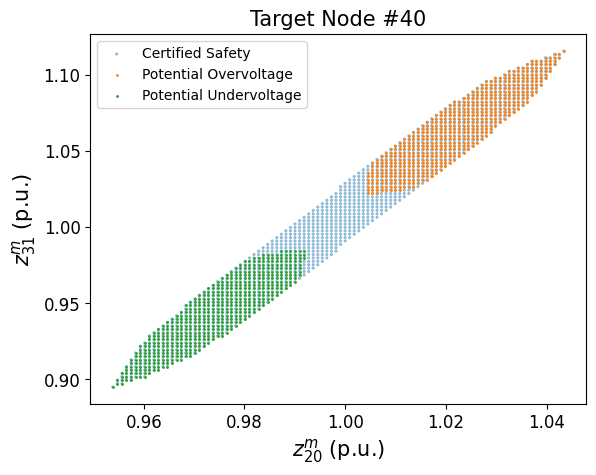

In [11]:
### Plot the 2-d region
feasible_set_x = []
feasible_set_y = []
unsafe_set_x = []
unsafe_set_y = []
unsafe_set_min_x = []
unsafe_set_min_y = []
actual_set_x = []
actual_set_y = []
safe_set_both_x = []
safe_set_both_y = []

for i in range(len(feasible_set)):
    feasible_set_x.append(feasible_set[i][0])
    feasible_set_y.append(feasible_set[i][1])

for i in range(len(unsafe_set)):
    unsafe_set_x.append(unsafe_set[i][0])
    unsafe_set_y.append(unsafe_set[i][1])

for i in range(len(unsafe_set_min)):
    unsafe_set_min_x.append(unsafe_set_min[i][0])
    unsafe_set_min_y.append(unsafe_set_min[i][1])

for i in range(len(safe_set_both)):
    safe_set_both_x.append(safe_set_both[i][0])
    safe_set_both_y.append(safe_set_both[i][1])

plt.scatter(feasible_set_x, feasible_set_y, alpha=0.5, edgecolors='none', s= 5, label='Certified Safety')
plt.scatter(unsafe_set_x, unsafe_set_y, s = 1, label="Potential Overvoltage")
plt.scatter(unsafe_set_min_x, unsafe_set_min_y, s = 1, label="Potential Undervoltage")


plt.legend(fontsize = 10)
label_x = fr"$z^m_{{{node_obs[0]+ 2}}}$ (p.u.)"
plt.xlabel(label_x, fontsize = 15)
label_y = fr"$z^m_{{{node_obs[1]+ 2}}}$ (p.u.)"
plt.ylabel(label_y, fontsize = 15)
plt.xticks(fontsize = 12)
plt.yticks(fontsize = 12)
plt.title('Target Node #{}'.format(target_node), fontsize = 15)


plt.show()

### Widest Alarm Box

In [12]:
def solve_safe_measured_box(
    A_m,
    A_u,
    x_lb,
    x_ub,
    v_min=-0.05,
    v_max=0.05,
    dual_ub=None,
    feasibility_margin=0.0,
    time_limit=None,
    mip_gap=1e-8,
    verbose=True,
):
    """

    To find the widest measured-voltage box

        v_s_lb <= A_m x <= v_s_ub

    such that all compatible unmeasured voltages satisfy

        v_min + tau <= A_u x <= v_max - tau.

    The robust constraints are reformulated by LP duality.
    """

    A_m = np.asarray(A_m, dtype=float)
    A_u = np.asarray(A_u, dtype=float)

    if A_u.ndim == 1:
        A_u = A_u.reshape(1, -1)

    x_lb = np.asarray(x_lb, dtype=float).reshape(-1)
    x_ub = np.asarray(x_ub, dtype=float).reshape(-1)

    m, n = A_m.shape
    p, n2 = A_u.shape

    if n != n2:
        raise ValueError(f"Dimension mismatch: A_m has {n} columns, A_u has {n2} columns.")

    if x_lb.shape != (n,) or x_ub.shape != (n,):
        raise ValueError("x_lb and x_ub must have shape (n,).")

    if np.any(x_lb > x_ub):
        raise ValueError("Some entries of x_lb are larger than x_ub.")

    model = gp.Model("safe_measured_box")

    if not verbose:
        model.setParam("OutputFlag", 0)

    model.setParam("NonConvex", 2)
    model.setParam("FeasibilityTol", 1e-6)
    model.setParam("OptimalityTol", 1e-6)
    model.setParam("MIPGap", mip_gap)

    if time_limit is not None:
        model.setParam("TimeLimit", time_limit)

    # ------------------------------------------------------------
    # Upper-level box variables
    # ------------------------------------------------------------

    v_s_lb = model.addVars(
        m,
        lb=float(v_min),
        ub=float(v_max),
        name="v_s_lb",
    )

    v_s_ub = model.addVars(
        m,
        lb=float(v_min),
        ub=float(v_max),
        name="v_s_ub",
    )


    # ------------------------------------------------------------
    # Nonempty lower-level feasible set:
    #
    # exists x0 such that
    # x_lb <= x0 <= x_ub,
    # v_s_lb <= A_m x0 <= v_s_ub.
    # ------------------------------------------------------------

    x0 = model.addVars(
        n,
        lb={k: float(x_lb[k] + feasibility_margin) for k in range(n)},
        ub={k: float(x_ub[k] - feasibility_margin) for k in range(n)},
        name="x0",
    )

    for i in range(m):
        A_m_x0_i = gp.quicksum(float(A_m[i, k]) * x0[k] for k in range(n))

        model.addConstr(
            A_m_x0_i >= v_s_lb[i] + feasibility_margin,
            name=f"x0_meas_lower_{i}",
        )

        model.addConstr(
            A_m_x0_i <= v_s_ub[i] - feasibility_margin,
            name=f"x0_meas_upper_{i}",
        )

    # ------------------------------------------------------------
    # Robust constraint helper:
    #
    # enforce
    #
    #     max_x q^T x <= eta
    #
    # subject to
    #
    #     x_lb <= x <= x_ub,
    #     v_s_lb <= A_m x <= v_s_ub.
    #
    # Dual certificate:
    #
    #     alpha_p - alpha_m + A_m^T beta_p - A_m^T beta_m = q
    #
    #     x_ub^T alpha_p - x_lb^T alpha_m
    #     + v_s_ub^T beta_p - v_s_lb^T beta_m <= eta.
    # ------------------------------------------------------------

    def add_robust_upper_bound(q, eta, name):
        q = np.asarray(q, dtype=float).reshape(-1)

        if q.shape != (n,):
            raise ValueError(f"{name}: q must have shape ({n},), got {q.shape}.")

        ub = GRB.INFINITY if dual_ub is None else dual_ub

        alpha_p = model.addVars(n, lb=0.0, ub = ub, name=f"{name}_alpha_p")
        alpha_m = model.addVars(n, lb=0.0,ub = ub, name=f"{name}_alpha_m")
        beta_p = model.addVars(m, lb=0.0,ub = ub, name=f"{name}_beta_p")
        beta_m = model.addVars(m, lb=0.0,ub = ub, name=f"{name}_beta_m")

        # Dual feasibility
        for k in range(n):
            lhs = (
                alpha_p[k]
                - alpha_m[k]
                + gp.quicksum(float(A_m[i, k]) * beta_p[i] for i in range(m))
                - gp.quicksum(float(A_m[i, k]) * beta_m[i] for i in range(m))
            )

            model.addConstr(
                lhs == float(q[k]),
                name=f"{name}_dual_feas_{k}",
            )

        # Dual objective
        dual_obj = gp.QuadExpr()

        for k in range(n):
            dual_obj.add(float(x_ub[k]) * alpha_p[k])
            dual_obj.add(-float(x_lb[k]) * alpha_m[k])

        for i in range(m):
            dual_obj.add(v_s_ub[i] * beta_p[i])
            dual_obj.add(-v_s_lb[i] * beta_m[i])

        # IMPORTANT:
        # Use the explicit addQConstr signature.
        # This avoids the Invalid argument error in some Gurobi versions.
        model.addQConstr(
            dual_obj,
            GRB.LESS_EQUAL,
            float(eta),
            name=f"{name}_dual_bound",
        )

        return {
            "alpha_p": alpha_p,
            "alpha_m": alpha_m,
            "beta_p": beta_p,
            "beta_m": beta_m,
            "dual_obj": dual_obj,
        }

    dual_certs = {}

    # ------------------------------------------------------------
    # Unmeasured-node robust safety constraints
    # ------------------------------------------------------------

    for j in range(p):
        c_j = A_u[j, :]

        # Upper safety:
        #
        #     max_x c_j^T x <= v_max - tau
        #
        dual_certs[(j, "upper")] = add_robust_upper_bound(
            q=c_j,
            eta=v_max,
            name=f"u{j}_upper",
        )

        # Lower safety:
        #
        #     min_x c_j^T x >= v_min + tau
        #
        # Equivalent:
        #
        #     max_x -c_j^T x <= -v_min - tau
        #
        dual_certs[(j, "lower")] = add_robust_upper_bound(
            q=-c_j,
            eta=-v_min,
            name=f"u{j}_lower",
        )

    # ------------------------------------------------------------
    # Objective: maximize measured-box width
    # ------------------------------------------------------------

    model.setObjective(
        gp.quicksum(v_s_ub[i] - v_s_lb[i] for i in range(m)),
        GRB.MAXIMIZE,
    )


    model.optimize()

    result = {
        "status": model.Status,
        "model": model,
        "dual_certs": dual_certs,
    }

    if model.SolCount > 0:
        v_s_lb_val = np.array([v_s_lb[i].X for i in range(m)])
        v_s_ub_val = np.array([v_s_ub[i].X for i in range(m)])
        x0_val = np.array([x0[k].X for k in range(n)])
        alpha_p_val = np.array([dual_certs[(0, "lower")]["alpha_p"][k].X for k in range(n)])
        alpha_m_val = np.array([dual_certs[(0, "lower")]["alpha_m"][k].X for k in range(n)])
        beta_p_val = np.array([dual_certs[(0, "lower")]["beta_p"][k].X for k in range(m)])
        beta_m_val = np.array([dual_certs[(0, "lower")]["beta_m"][k].X for k in range(m)])

        result.update(
            {
                "objective": model.ObjVal,
                "v_s_lb": v_s_lb_val,
                "v_s_ub": v_s_ub_val,
                "width": v_s_ub_val - v_s_lb_val,
                "x0": x0_val,
                "alpha_p": alpha_p_val,
                "alpha_m": alpha_m_val,
                "beta_p": beta_p_val,
                "beta_m": beta_m_val,
            }
        )

    return result

In [13]:
result = solve_safe_measured_box(
    A_m=BB[node_obs, :],
    A_u=BB[target_node, :].reshape(1, -1),
    x_lb=x1,
    x_ub=x2,
    v_min=-0.05,
    v_max=0.05,
    dual_ub=1e3,
    feasibility_margin=0.0,
    time_limit=500,
    mip_gap=1e-6,
    verbose=True,
)
    
v_s_lb = result["v_s_lb"]
v_s_ub = result["v_s_ub"]

Set parameter NonConvex to value 2
Set parameter FeasibilityTol to value 1e-06
Set parameter OptimalityTol to value 1e-06
Set parameter MIPGap to value 1e-06
Set parameter TimeLimit to value 500
Gurobi Optimizer version 13.0.2 build v13.0.2rc1 (mac64[arm] - Darwin 25.3.0 25D2128)

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Non-default parameters:
TimeLimit  500
MIPGap  1e-06
NonConvex  2

Optimize a model with 224 rows, 562 columns and 1764 nonzeros (Max)
Model fingerprint: 0xbe5127c7
Model has 4 linear objective coefficients
Model has 2 quadratic constraints
Coefficient statistics:
  Matrix range     [1e-03, 1e+00]
  QMatrix range    [1e+00, 1e+00]
  QLMatrix range   [6e-03, 2e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [6e-03, 1e+03]
  RHS range        [1e-03, 3e-02]
  QRHS range       [5e-02, 5e-02]

Presolve removed 48 rows and 189 columns

Continuous model is non-convex -- solving as a MIP


Presolve removed 48 ro

## Draw Figure 1

In [14]:
### historical data voltage 
vm_list = []

for t in range(horizon):
    vv1 = BB[node_obs[0], :] @ np.hstack([p_pv_arr[:, t] - p_arr[:, t], q_pv_arr[:, t] - q_arr[:, t]])
    vv2 = BB[node_obs[1], :] @ np.hstack([p_pv_arr[:, t] - p_arr[:, t], q_pv_arr[:, t] - q_arr[:, t]])
    vm_list.append(np.array([vv1, vv2]))
    
for i in range(10):
    actual_set_x.append(vm_list[i][0]+ 1)
    actual_set_y.append(vm_list[i][1] + 1)

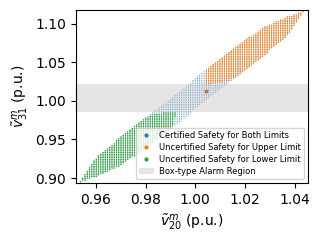

In [15]:
fig, ax = plt.subplots(figsize=(3, 2.25))

ax.scatter(
    feasible_set_x, feasible_set_y,
    edgecolors='none',
    s=0.5,
    label=r'Certified Safety for Both Limits',
    zorder=1
)

ax.scatter(
    unsafe_set_x, unsafe_set_y,
    edgecolors='none',
    s=1,
    label=r"Uncertified Safety for Upper Limit",
    zorder=1
)

ax.scatter(
    unsafe_set_min_x, unsafe_set_min_y,
    edgecolors='none',
    s=1,
    label=r"Uncertified Safety for Lower Limit",
    zorder=1
)

ax.scatter(
    actual_set_x[3], actual_set_y[3],
    s=5,
    marker='*',
    # label=r"On",
    zorder=1
)

# Box coordinates
x_low = v_s_lb[0] + 1
x_upp = v_s_ub[0] + 1
y_low = v_s_lb[1] + 1
y_upp = v_s_ub[1] + 1

# Rectangle patch
rect = patches.Rectangle(
    (x_low, y_low),
    x_upp - x_low,
    y_upp - y_low,
    facecolor="Silver",
    edgecolor="None",
    linestyle="--",
    linewidth=1.5,
    alpha=0.4,
    label=r"Box-type Alarm Region",
    zorder=2
)

ax.add_patch(rect)

# Labels
label_x = fr"$\tilde{{v}}^m_{{{node_obs[0] + 2}}}$ (p.u.)"
label_y = fr"$\tilde{{v}}^m_{{{node_obs[1] + 2}}}$ (p.u.)"

ax.set_xlabel(label_x)
ax.set_ylabel(label_y)
#ax.set_title(f"Target Node #{target_node}", fontsize=15)

ax.tick_params(axis='both')

# Optional but recommended
# ax.axis("equal")

# ============================================================
# Custom legend
# ============================================================
legend_handles = [
    Line2D(
        [], [],
        marker='o',
        linestyle='None',
        markerfacecolor='C0',
        markeredgecolor='none',
        markersize=3,
        label=r'Certified Safety for Both Limits'
    ),

    Line2D(
        [], [],
        marker='o',
        linestyle='None',
        markerfacecolor='C1',
        markeredgecolor='none',
        markersize=3,
        label=r'Uncertified Safety for Upper Limit'
    ),

    Line2D(
        [], [],
        marker='o',
        linestyle='None',
        markerfacecolor='C2',
        markeredgecolor='none',
        markersize=3,
        label=r'Uncertified Safety for Lower Limit'
    ),

    patches.Patch(
        facecolor='Silver',
        edgecolor='None',
        linestyle='--',
        linewidth=1.2,
        alpha=0.4,
        label=r'Box-type Alarm Region'
    )
]

ax.legend(
    handles=legend_handles,
    loc='lower right',
    fontsize=6,
    handlelength=1.8,
    handletextpad=0.6,
    borderpad=0.4,
    labelspacing=0.35
)

#ax.legend(loc="lower right", fontsize=6)


ax.set_xlim([np.min(feasible_set_x) * 0.998, np.max(feasible_set_x) * 1.002])
ax.set_ylim([np.min(feasible_set_y) * 0.998, np.max(feasible_set_y) * 1.002])


#plt.savefig('fig1-2-intro_new2.pdf', dpi=300, bbox_inches='tight')
plt.show()

# Results of Table 1&2 and Figure 2

In [17]:
### Length of each dataset: daily voltage profile with 5 min interval T = 12 * 24 = 288
horizon_day = 288

In [18]:
### Choose the proper value for Big-M 
print(np.min(BB @ x1))
print(np.max(BB @ x2))

# M = 0.15

-0.13468990378471613
0.1480562300472629


In [23]:
### Full voltage data for LinDistFlow
vv_list = []

for t in range(horizon):
    vv = []
    for j in range(num_node):
        vvj = BB[j, :] @ np.hstack([p_pv_arr[:, t] - p_arr[:, t], q_pv_arr[:, t] - q_arr[:, t]])
        vv.append(vvj)
    vv_list.append(np.array(vv))

print(len(vv_list))

8928


### Functions for Performance Evaluation

In [19]:
### Calculate the voltage violation metric of given selected measurement $H(s)$
def vol_violation_full(mea_selected, set_index):
    info_list0 = []
    info_list1 = []
    nodescenario_list0 = []
    nodescenario_list1 = []

    ### define the problem outside the iteration to reduce the cvxpy overhead
    xx = cp.Variable(2 * num_node)

    c_par = cp.Parameter(2 * num_node)
    vm_par = cp.Parameter(len(mea_selected))

    obj1 = cp.Minimize(c_par @ xx)
    obj2 = cp.Maximize(c_par @ xx)

    constraint = [x1 <= xx]
    constraint += [xx <= x2]
    # slightly relax it
    for i in range(len(mea_selected)):
        constraint += [BB[mea_selected[i], :] @ xx == vm_par[i]]

    prob1 = cp.Problem(obj1, constraint)
    prob2 = cp.Problem(obj2, constraint)


    for node in list(range(num_node)):
        for scenario in list(range(set_index * horizon_day, (set_index + 1)*horizon_day)):
            c_par.value = np.array(BB[node, :])
            vm_list = []
            for i in range(len(mea_selected)):
                vm_list.append(np.array(vv_list)[scenario][mea_selected[i]])

            vm_par.value = np.array(vm_list)

            prob1.solve(solver=cp.GUROBI,
            warm_start=True,
            verbose=False)

            prob2.solve(solver=cp.GUROBI,
            warm_start=True,
            verbose=False)
        
            vol_ach_min = np.array(prob1.value)
            vol_ach_max = np.array(prob2.value)

            info0 = max((-0.05 - vol_ach_min), 0) 
            info1 = max((vol_ach_max - 0.05), 0)

            print("Nodescenario pair ({}, {})".format(node, scenario)) 
            print(info0) 
            print(info1) 
            if info0 > 0.:
                info_list0.append(info0)
                nodescenario_list0.append([node, scenario])
            if info1 > 0.0:
                info_list1.append(info1)
                nodescenario_list1.append([node, scenario])
    
    return info_list0, info_list1, nodescenario_list0, nodescenario_list1

## Fixed Threshold with Different Safety Margin over One Dataset 

In [20]:
def fixed_threshold_construct(set_index, margin):
    """
    Given the set_index and safety margin, it constrcuts the scenario-reduction sets
    """
    ### Upper limit
    vol_violation_nodescenario_upp = {}
    for i in range(set_index * horizon_day, (set_index + 1)*horizon_day):
        for j in range(num_node):
            if vv_list[i][j] >= 0.05 - margin:
                vol_violation_nodescenario_upp[(j, i)] = vv_list[i][j]
    
    nodescenario_pair_upp = list(vol_violation_nodescenario_upp.keys()) # this is to only take (i, t)
    nodescenario_pair_upp = [list(x) for x in nodescenario_pair_upp]

    ### Lower limit
    vol_violation_nodescenario_low = {}
    for i in range(set_index  * horizon_day, (set_index + 1) * horizon_day):
        for j in range(num_node):
            if vv_list[i][j] <= -0.05 + margin: 
                vol_violation_nodescenario_low[(j, i)] = vv_list[i][j]

    nodescenario_pair_low = list(vol_violation_nodescenario_low.keys())
    nodescenario_pair_low = [list(x) for x in nodescenario_pair_low]

                
    return nodescenario_pair_upp, nodescenario_pair_low

In [21]:
def fixed_threshold_solve(A, 
                          x_min, 
                          x_max, 
                          nodescenario_pair_upp, 
                          nodescenario_pair_low, 
                          rho, 
                          C_matrix,
                          v_min,
                          v_max,
                          M_val,
                          mip_gap,
                          time_limit=1000):

    # ------------------------------------------------------------
    # 1. Dimensions and data
    # ------------------------------------------------------------
    n = num_node

    R_low = nodescenario_pair_low
    R_upp = nodescenario_pair_upp

    num_R_low = len(R_low)
    num_R_upp = len(R_upp)

    # ------------------------------------------------------------
    # 2. Initialize model
    # ------------------------------------------------------------
    m = gp.Model("Scenario_reduction_fixed_threshold")

    ### Make computation time consistent
    m.setParam('Threads', 8)
    m.setParam('Seed', 40)

    # ------------------------------------------------------------
    # 3. measurement placement variables
    # ------------------------------------------------------------
    s = m.addVars(n, vtype=GRB.BINARY, name="s")


    # ------------------------------------------------------------
    # 4. Slack variables
    # ------------------------------------------------------------
    # Lower-limit violation slack:
    #     f_i^low(s,t) >= v_min - ell_low[q]
    ell_low = m.addVars(num_R_low, lb=0.0, name="ell_low")

    # Upper-limit violation slack:
    #     f_i^upp(s,t) <= v_max + ell_upp[q]
    ell_upp = m.addVars(num_R_upp, lb=0.0, name="ell_upp")

    # ------------------------------------------------------------
    # 5. Dual variables for LOWER-limit selected  pairs
    # ------------------------------------------------------------
    # Lower-limit primal:
    #
    #     min_x c_i^T x
    #     s.t. x_min <= x <= x_max
    #          v_under(s,t) <= A x <= v_bar(s,t)
    #
    # Dual expression:
    #
    #     alpha_l^T x_min - alpha_u^T x_max
    #     + beta_l^T v_under - beta_u^T v_bar
    #
    alpha_l_low = m.addVars(num_R_low, 2*n, lb=0.0, name="alpha_l_low")
    alpha_u_low = m.addVars(num_R_low, 2*n, lb=0.0, name="alpha_u_low")
    beta_l_low  = m.addVars(num_R_low, n,   lb=0.0, name="beta_l_low")
    beta_u_low  = m.addVars(num_R_low, n,   lb=0.0, name="beta_u_low")

    # ------------------------------------------------------------
    # 6. Dual variables for UPPER-limit selected pairs
    # ------------------------------------------------------------
    # Upper-limit primal:
    #
    #     max_x c_i^T x
    #     s.t. x_min <= x <= x_max
    #          v_under(s,t) <= A x <= v_bar(s,t)
    #
    # Dual expression:
    #
    #     alpha_u^T x_max - alpha_l^T x_min
    #     + beta_u^T v_bar - beta_l^T v_under
    #
    alpha_l_upp = m.addVars(num_R_upp, 2*n, lb=0.0, name="alpha_l_upp")
    alpha_u_upp = m.addVars(num_R_upp, 2*n, lb=0.0, name="alpha_u_upp")
    beta_l_upp  = m.addVars(num_R_upp, n,   lb=0.0, name="beta_l_upp")
    beta_u_upp  = m.addVars(num_R_upp, n,   lb=0.0, name="beta_u_upp")

    # ------------------------------------------------------------
    # 7. Objective
    # ------------------------------------------------------------
    # Minimize total violation metric for lower-limit and upper-limit
    m.setObjective(
        gp.quicksum(ell_low[q] for q in range(num_R_low))
        + gp.quicksum(ell_upp[q] for q in range(num_R_upp)),
        GRB.MINIMIZE
    )

    # ------------------------------------------------------------
    # 8. measurement budget
    # ------------------------------------------------------------
    m.addConstr(
        gp.quicksum(s[j] for j in range(n)) == rho,
        name="budget"
    )

    # ------------------------------------------------------------
    # 9. LOWER-limit strong-duality constraints
    # ------------------------------------------------------------
    for q, (i, t) in enumerate(R_low):

        ci = C_matrix[i, :]
        v_const = vv_list[t]

        lower_expr = gp.LinExpr()

        # --------------------------------------------------------
        # Dual objective for lower-limit min problem:
        #
        #     alpha_l^T x_min - alpha_u^T x_max
        #     + beta_l^T v_under - beta_u^T v_bar
        #
        # where
        #
        #     v_under[k] = v_const[k] * s[k] - M_val * (1 - s[k])
        #                = -M_val + (v_const[k] + M_val) * s[k]
        #
        #     v_bar[k]   = v_const[k] * s[k] + M_val * (1 - s[k])
        #                =  M_val + (v_const[k] - M_val) * s[k]
        # --------------------------------------------------------

        # alpha terms
        lower_expr += gp.quicksum(
            alpha_l_low[q, j] * x_min[j]
            for j in range(2*n)
        )

        lower_expr -= gp.quicksum(
            alpha_u_low[q, j] * x_max[j]
            for j in range(2*n)
        )

        # expanded beta terms
        for k in range(n):

            # beta_l * v_under
            lower_expr += -M_val * beta_l_low[q, k]
            lower_expr += (v_const[k] + M_val) * beta_l_low[q, k] * s[k]

            # - beta_u * v_bar
            lower_expr += -M_val * beta_u_low[q, k]
            lower_expr += -(v_const[k] - M_val) * beta_u_low[q, k] * s[k]

        # Lower-limit violation constraint:
        #
        #     f_i^low(s,t) >= v_min - ell_low[q]
        #
        # Since lower_expr equals the lower-limit primal optimum
        # through strong duality, enforce:
        #
        #     lower_expr >= v_min - ell_low[q]
        m.addConstr(
            lower_expr >= v_min - ell_low[q],
            name=f"lower_main_q{q}_i{i}_t{t}"
        )

        # --------------------------------------------------------
        # Dual feasibility / stationarity for lower-limit min problem
        #
        #     c_i - alpha_l + alpha_u - A^T beta_l + A^T beta_u = 0
        # --------------------------------------------------------
        for j in range(2*n):
            m.addConstr(
                ci[j]
                - alpha_l_low[q, j]
                + alpha_u_low[q, j]
                - gp.quicksum(A[k, j] * beta_l_low[q, k] for k in range(n))
                + gp.quicksum(A[k, j] * beta_u_low[q, k] for k in range(n))
                == 0,
                name=f"lower_dual_balance_q{q}_j{j}"
            )

    # ------------------------------------------------------------
    # 10. UPPER-limit strong-duality constraints
    # ------------------------------------------------------------
    for q, (i, t) in enumerate(R_upp):

        ci = C_matrix[i, :]
        v_const = vv_list[t]

        upper_expr = gp.LinExpr()

        # --------------------------------------------------------
        # Dual objective for upper-limit max problem:
        #
        #     alpha_u^T x_max - alpha_l^T x_min
        #     + beta_u^T v_bar - beta_l^T v_under
        #
        # where
        #
        #     v_under[k] = -M_val + (v_const[k] + M_val) * s[k]
        #     v_bar[k]   =  M_val + (v_const[k] - M_val) * s[k]
        # --------------------------------------------------------

        # alpha terms
        upper_expr += gp.quicksum(
            alpha_u_upp[q, j] * x_max[j]
            for j in range(2*n)
        )

        upper_expr -= gp.quicksum(
            alpha_l_upp[q, j] * x_min[j]
            for j in range(2*n)
        )

        # expanded beta terms
        for k in range(n):

            # beta_u * v_bar
            upper_expr += M_val * beta_u_upp[q, k]
            upper_expr += (v_const[k] - M_val) * beta_u_upp[q, k] * s[k]

            # - beta_l * v_under
            upper_expr += M_val * beta_l_upp[q, k]
            upper_expr += -(v_const[k] + M_val) * beta_l_upp[q, k] * s[k]

        # Upper-limit violation constraint:
        #
        #     f_i^upp(s,t) <= v_max + ell_upp[q]
        #
        # Since upper_expr equals the upper-limit primal optimum
        # through strong duality, enforce:
        #
        #     upper_expr <= v_max + ell_upp[q]
        m.addConstr(
            upper_expr <= v_max + ell_upp[q],
            name=f"upper_main_q{q}_i{i}_t{t}"
        )

        # --------------------------------------------------------
        # Dual feasibility / stationarity for upper-limit max problem
        #
        #     c_i - alpha_u + alpha_l - A^T beta_u + A^T beta_l = 0
        # --------------------------------------------------------
        for j in range(2*n):
            m.addConstr(
                ci[j]
                - alpha_u_upp[q, j]
                + alpha_l_upp[q, j]
                - gp.quicksum(A[k, j] * beta_u_upp[q, k] for k in range(n))
                + gp.quicksum(A[k, j] * beta_l_upp[q, k] for k in range(n))
                == 0,
                name=f"upper_dual_balance_q{q}_j{j}"
            )

    # ------------------------------------------------------------
    # 11. Gurobi parameters
    # ------------------------------------------------------------
    m.setParam("NonConvex", 2)

    m.setParam("MIPFocus", 2)
    m.setParam("Presolve", 2)
    m.setParam("Cuts", 2)
    m.setParam("MIPGap", mip_gap)
    m.setParam("TimeLimit", time_limit)

    # ------------------------------------------------------------
    # 12. Optimize
    # ------------------------------------------------------------
    m.optimize()

    # ------------------------------------------------------------
    # 13. Extract solution
    # ------------------------------------------------------------
    print("\n--- Optimization status")
    print(m.Status)

    if m.Status in [GRB.OPTIMAL, GRB.TIME_LIMIT, GRB.SUBOPTIMAL]:

        print("\n--- Selected measurements")
        selected_measurements = [i for i in range(n) if s[i].X > 0.5]
        print(selected_measurements)

        print("\n--- Objective value")
        print(m.ObjVal)

    else:
        print("\nModel did not return a usable solution.")
    

    H_R = m.ObjVal
    return H_R, m.Runtime, selected_measurements

In [24]:
margin_list = [0, 0.005, 0.01]
index = 2

H_R_list = []
Scenario_set_size_list = []
Time_list = []
Mea_selected_list = []

for margin in margin_list:  
    print('*'*20)
    print("Current safety margin is {}".format(margin))
    nodescenario_pair_upp, nodescenario_pair_low = fixed_threshold_construct(set_index=index, margin=margin)

    Scenario_set_size_list.append(len(nodescenario_pair_upp) + len(nodescenario_pair_low))

    H_R, Time_fix, Mea_selected = fixed_threshold_solve(A = BB, x_min= x1, x_max=x2, nodescenario_pair_upp=nodescenario_pair_upp, nodescenario_pair_low=nodescenario_pair_low,
                            rho=8, C_matrix= BB, v_min=-0.05, v_max=0.05, M_val=0.15, mip_gap=1e-4, time_limit=1e3)

    H_R_list.append(H_R)

    Time_list.append(Time_fix)

    Mea_selected_list.append(Mea_selected)

********************
Current safety margin is 0
Set parameter Threads to value 8
Set parameter Seed to value 40
Set parameter NonConvex to value 2
Set parameter MIPFocus to value 2
Set parameter Presolve to value 2
Set parameter Cuts to value 2
Set parameter MIPGap to value 0.0001
Set parameter TimeLimit to value 1000
Gurobi Optimizer version 13.0.2 build v13.0.2rc1 (mac64[arm] - Darwin 25.3.0 25D2128)

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Non-default parameters:
TimeLimit  1000
MIPFocus  2
Cuts  2
NonConvex  2
Presolve  2
Seed  40
Threads  8

Optimize a model with 661 rows, 2041 columns and 73975 nonzeros (Min)
Model fingerprint: 0xed2167cf
Model has 6 linear objective coefficients
Model has 6 quadratic constraints
Variable types: 1986 continuous, 55 integer (55 binary)
Coefficient statistics:
  Matrix range     [1e-03, 1e+00]
  QMatrix range    [1e-01, 2e-01]
  QLMatrix range   [6e-03, 2e+00]
  Objective range  [1e+00, 1e+00

In [25]:
### Results of Table 1
######################
print(H_R_list)
print(Scenario_set_size_list)
print(Time_list)

### Optimality check
info_list0, info_list1, _, _ = vol_violation_full(Mea_selected_list[-1], set_index=index)

print("Full voltage violation metric under $s_R$ is {}".format(np.sum(info_list0) + np.sum(info_list1)))

[0.0057802066616366166, 0.006090185499011129, 0.006760133614004492]
[6, 31, 67]
[0.6526610851287842, 8.736924171447754, 27.56847906112671]
Nodescenario pair (0, 576)
0
0
Nodescenario pair (0, 577)
0
0
Nodescenario pair (0, 578)
0
0
Nodescenario pair (0, 579)
0
0
Nodescenario pair (0, 580)
0
0
Nodescenario pair (0, 581)
0
0
Nodescenario pair (0, 582)
0
0
Nodescenario pair (0, 583)
0
0
Nodescenario pair (0, 584)
0
0
Nodescenario pair (0, 585)
0
0
Nodescenario pair (0, 586)
0
0
Nodescenario pair (0, 587)
0
0
Nodescenario pair (0, 588)
0
0
Nodescenario pair (0, 589)
0
0
Nodescenario pair (0, 590)
0
0
Nodescenario pair (0, 591)
0
0
Nodescenario pair (0, 592)
0
0
Nodescenario pair (0, 593)
0
0
Nodescenario pair (0, 594)
0
0
Nodescenario pair (0, 595)
0
0
Nodescenario pair (0, 596)
0
0
Nodescenario pair (0, 597)
0
0
Nodescenario pair (0, 598)
0
0
Nodescenario pair (0, 599)
0
0
Nodescenario pair (0, 600)
0
0
Nodescenario pair (0, 601)
0
0
Nodescenario pair (0, 602)
0
0
Nodescenario pair (0, 60

We note that due to the differences in hardware performance, the absolute computation time experienced by different people may vary, but the relative relationships remain preserved.

## Fixed Threshold with Safety Margin $\sigma = 0.01$ over Ten Datasets

In [26]:
### Arbitrarily select 10 datasets to evaluate the performance
dataset_num = 10

random.seed(18956)
index_list = random.sample(range(20), dataset_num)

index_list = sorted(index_list)
print(index_list)

[0, 1, 2, 3, 5, 6, 7, 9, 10, 11]


In [27]:
margin = 0.01

H_R_list = []
Scenario_set_size_list = []
Time_list = []
Mea_selected_list = []

for index in index_list:
    print('*'*20)
    print("Current index of dataset is {}".format(index))
    nodescenario_pair_upp, nodescenario_pair_low = fixed_threshold_construct(set_index=index, margin=margin)

    Scenario_set_size_list.append(len(nodescenario_pair_upp) + len(nodescenario_pair_low))

    H_R, Time_fix, Mea_selected = fixed_threshold_solve(A = BB, x_min= x1, x_max=x2, nodescenario_pair_upp=nodescenario_pair_upp, 
    nodescenario_pair_low=nodescenario_pair_low, rho=8, C_matrix= BB, v_min=-0.05, v_max=0.05, M_val=0.15, mip_gap=1e-4, time_limit=1e3)

    H_R_list.append(H_R)

    Time_list.append(Time_fix)

    Mea_selected_list.append(Mea_selected)

********************
Current index of dataset is 0
Set parameter Threads to value 8
Set parameter Seed to value 40
Set parameter NonConvex to value 2
Set parameter MIPFocus to value 2
Set parameter Presolve to value 2
Set parameter Cuts to value 2
Set parameter MIPGap to value 0.0001
Set parameter TimeLimit to value 1000
Gurobi Optimizer version 13.0.2 build v13.0.2rc1 (mac64[arm] - Darwin 25.3.0 25D2128)

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Non-default parameters:
TimeLimit  1000
MIPFocus  2
Cuts  2
NonConvex  2
Presolve  2
Seed  40
Threads  8

Optimize a model with 9791 rows, 29514 columns and 1096535 nonzeros (Min)
Model fingerprint: 0xd708ee0c
Model has 89 linear objective coefficients
Model has 89 quadratic constraints
Variable types: 29459 continuous, 55 integer (55 binary)
Coefficient statistics:
  Matrix range     [1e-03, 1e+00]
  QMatrix range    [9e-02, 2e-01]
  QLMatrix range   [6e-03, 2e+00]
  Objective range  [1e

In [ ]:
### Optimality check 
H_list = []

for i in range(dataset_num):
    info_list0, info_list1, _, _ = vol_violation_full(Mea_selected_list[i], set_index=index_list[i])

    H = np.sum(info_list0) + np.sum(info_list1)
    H_list.append(H)
    print("Full voltage violation metric at index {} is {}".format(index_list[i], H))


In [28]:
### Results of Table 2-Row 1
######################
print(H_R_list)
print("Mean value of $H_R$ is {}".format(np.mean(H_R_list)))
print(Scenario_set_size_list)
print("Mean value of size of scenario reduction set is {}".format(np.mean(Scenario_set_size_list)))
print(Time_list)
print("Mean value of computation time is {}".format(np.mean(Time_list)))

[0.017302805730679494, 0.053065536474030985, 0.006760133614004492, 0.001373971237052185, 0.02686682502759052, 0.02747870485158417, 0.16022711321050837, 0.026654907632642697, 0.010967709447180354, 0.0013768239316016284]
Mean value of $H_R$ is 0.03320745311568749
[89, 189, 67, 102, 109, 108, 63, 66, 117, 63]
Mean value of size of scenario reduction set is 97.3
[9.212091207504272, 208.5420880317688, 29.468924045562744, 12.17805290222168, 57.84286594390869, 11.963265895843506, 466.1552369594574, 25.01309585571289, 20.70823884010315, 7.3555989265441895]
Mean value of computation time is 84.84394586086273


## Constraint Generation with Stepsize $\delta^l = \delta^u = 0.005$ over Ten Datasets

### Main Framework

In [29]:
### Voltage certification for lower bound
def solve_lower_value(A, x_lb, x_ub, vv_list, measurement_set, i, t, tol_eq=1e-6):
    """
    Compute f_i^{(t)}:

        min_x A[i, :] x
        s.t. x_lb <= x <= x_ub
             A[S, :] x = v_S^{(t)}
    """
    d = A.shape[1]
    x = cp.Variable(d)

    constraints = [
        x >= x_lb,
        x <= x_ub,
    ]

    if len(measurement_set) > 0:
        v_meas = vv_list[t, measurement_set]
        constraints += [
            A[measurement_set, :] @ x <= v_meas + tol_eq,
            A[measurement_set, :] @ x >= v_meas - tol_eq,
        ]

    prob = cp.Problem(cp.Minimize(A[i, :] @ x), constraints)

    try:
        prob.solve(solver="CLARABEL")
    except Exception:
        prob.solve()

    return prob.value, prob.status

In [30]:
### Voltage certification for upper bound
def solve_upper_value(A, x_lb, x_ub, vv_list, measurement_set, i, t, tol_eq=1e-6):
    """
    Compute g_i^{(t)}:

        max_x A[i, :] x
        s.t. x_lb <= x <= x_ub
             A[S, :] x = v_S^{(t)}
    """
    d = A.shape[1]
    x = cp.Variable(d)

    constraints = [
        x >= x_lb,
        x <= x_ub,
    ]

    if len(measurement_set) > 0:
        v_meas = vv_list[t, measurement_set]
        constraints += [
            A[measurement_set, :] @ x <= v_meas + tol_eq,
            A[measurement_set, :] @ x >= v_meas - tol_eq,
        ]

    prob = cp.Problem(cp.Maximize(A[i, :] @ x), constraints)

    try:
        prob.solve(solver="CLARABEL")
    except Exception:
        prob.solve()

    return prob.value, prob.status

In [31]:
### Initialization
def initialize_risk_sets(vv_list, v_min=-0.05, v_max=0.05, eps_l=0.0, eps_u=0.0):
    """
    Initialize scenario reduction sets.

    If eps_l = eps_u = 0:
        R_l = {(i,t) | v_i^(t) <= v_min}
        R_u = {(i,t) | v_i^(t) >= v_max}

    If eps_l, eps_u > 0:
        include near-boundary points.
    """
    T, n = vv_list.shape

    R_l = set()
    R_u = set()

    for t in range(T):
        for i in range(n):
            if vv_list[t, i] <= v_min + eps_l:
                R_l.add((i, t))
            if vv_list[t, i] >= v_max - eps_u:
                R_u.add((i, t))

    return R_l, R_u

In [32]:
def constraint_gen_solve(
    R_l,
    R_u,
    s_prev=None,
    n=None,
    r=8,
    A=None,
    C_matrix=None,
    x_lb=None,
    x_ub=None,
    vv_list=None,
    v_min=-0.05,
    v_max=0.05,
    M_val=0.15,
    time_limit=1000,
    mip_gap=1e-4,
    mip_focus=2,
    presolve=2,
    cuts=2,
    verbose=False,
):
    """
    Measurement placement over current R_l and R_u.

    Parameters
    ----------
    R_l : set[tuple[int, int]]
        Current lower-limit pairs.
    R_u : set[tuple[int, int]]
        Current upper-limit pairs.
    s_prev : ndarray or None
        Previous binary solution used as warm start.
    n : int
        Number of buses.
    r : int
        measurement budget.
    A : ndarray, shape (n, 2n)
        Voltage linear map.
    C_matrix : ndarray, shape (n, 2n)
        Objective coefficient matrix. Usually same as A.
    x_lb, x_ub : ndarray, shape (2n,)
        Lower/upper bounds of state variable.
    vv_list : ndarray, shape (T, n)
        Historical voltage data.
    M_val : float
        Big-M value for measurement activation.
    """

    if C_matrix is None:
        C_matrix = A

    if n is None:
        n = A.shape[0]

    R_low = list(R_l)
    R_upp = list(R_u)

    num_R_low = len(R_low)
    num_R_upp = len(R_upp)

    m = gp.Model("Scenario_reduction_constraint_gen")

    ### Make computation time consistent
    m.setParam('Threads', 8)
    m.setParam('Seed', 40)

    if not verbose:
        m.setParam("OutputFlag", 0)

    # --------------------------------------------------------
    # measurement variables
    # --------------------------------------------------------
    s = m.addVars(n, vtype=GRB.BINARY, name="s")

    # Warm start
    if s_prev is not None:
        for j in range(n):
            s[j].Start = float(int(s_prev[j]))

    # --------------------------------------------------------
    # Slack variables
    # --------------------------------------------------------
    ell_low = m.addVars(num_R_low, lb=0.0, name="ell_low")
    ell_upp = m.addVars(num_R_upp, lb=0.0, name="ell_upp")

    # --------------------------------------------------------
    # Dual variables for lower-limit pairs
    # --------------------------------------------------------
    alpha_l_low = m.addVars(num_R_low, 2 * n, lb=0.0, name="alpha_l_low")
    alpha_u_low = m.addVars(num_R_low, 2 * n, lb=0.0, name="alpha_u_low")
    beta_l_low = m.addVars(num_R_low, n, lb=0.0, name="beta_l_low")
    beta_u_low = m.addVars(num_R_low, n, lb=0.0, name="beta_u_low")

    # --------------------------------------------------------
    # Dual variables for upper-limit pairs
    # --------------------------------------------------------
    alpha_l_upp = m.addVars(num_R_upp, 2 * n, lb=0.0, name="alpha_l_upp")
    alpha_u_upp = m.addVars(num_R_upp, 2 * n, lb=0.0, name="alpha_u_upp")
    beta_l_upp = m.addVars(num_R_upp, n, lb=0.0, name="beta_l_upp")
    beta_u_upp = m.addVars(num_R_upp, n, lb=0.0, name="beta_u_upp")

    # --------------------------------------------------------
    # Objective
    # --------------------------------------------------------
    m.setObjective(
        gp.quicksum(ell_low[q] for q in range(num_R_low))
        + gp.quicksum(ell_upp[q] for q in range(num_R_upp)),
        GRB.MINIMIZE,
    )

    # --------------------------------------------------------
    # measurement budget
    # --------------------------------------------------------
    m.addConstr(
        gp.quicksum(s[j] for j in range(n)) == r,
        name="budget",
    )

    # --------------------------------------------------------
    # Lower-limit strong-duality constraints
    # --------------------------------------------------------
    for q, (i, t) in enumerate(R_low):

        ci = C_matrix[i, :]
        v_const = vv_list[t]

        lower_expr = gp.LinExpr()

        lower_expr += gp.quicksum(
            alpha_l_low[q, j] * x_lb[j]
            for j in range(2 * n)
        )

        lower_expr -= gp.quicksum(
            alpha_u_low[q, j] * x_ub[j]
            for j in range(2 * n)
        )

        for k in range(n):
            # beta_l * v_under
            lower_expr += -M_val * beta_l_low[q, k]
            lower_expr += (v_const[k] + M_val) * beta_l_low[q, k] * s[k]

            # - beta_u * v_bar
            lower_expr += -M_val * beta_u_low[q, k]
            lower_expr += -(v_const[k] - M_val) * beta_u_low[q, k] * s[k]

        m.addConstr(
            lower_expr >= v_min - ell_low[q],
            name=f"lower_main_q{q}_i{i}_t{t}",
        )

        for j in range(2 * n):
            m.addConstr(
                ci[j]
                - alpha_l_low[q, j]
                + alpha_u_low[q, j]
                - gp.quicksum(A[k, j] * beta_l_low[q, k] for k in range(n))
                + gp.quicksum(A[k, j] * beta_u_low[q, k] for k in range(n))
                == 0,
                name=f"lower_dual_balance_q{q}_j{j}",
            )

    # --------------------------------------------------------
    # Upper-limit strong-duality constraints
    # --------------------------------------------------------
    for q, (i, t) in enumerate(R_upp):

        ci = C_matrix[i, :]
        v_const = vv_list[t]

        upper_expr = gp.LinExpr()

        upper_expr += gp.quicksum(
            alpha_u_upp[q, j] * x_ub[j]
            for j in range(2 * n)
        )

        upper_expr -= gp.quicksum(
            alpha_l_upp[q, j] * x_lb[j]
            for j in range(2 * n)
        )

        for k in range(n):
            # beta_u * v_bar
            upper_expr += M_val * beta_u_upp[q, k]
            upper_expr += (v_const[k] - M_val) * beta_u_upp[q, k] * s[k]

            # - beta_l * v_under
            upper_expr += M_val * beta_l_upp[q, k]
            upper_expr += -(v_const[k] + M_val) * beta_l_upp[q, k] * s[k]

        m.addConstr(
            upper_expr <= v_max + ell_upp[q],
            name=f"upper_main_q{q}_i{i}_t{t}",
        )

        for j in range(2 * n):
            m.addConstr(
                ci[j]
                - alpha_u_upp[q, j]
                + alpha_l_upp[q, j]
                - gp.quicksum(A[k, j] * beta_u_upp[q, k] for k in range(n))
                + gp.quicksum(A[k, j] * beta_l_upp[q, k] for k in range(n))
                == 0,
                name=f"upper_dual_balance_q{q}_j{j}",
            )

    # --------------------------------------------------------
    # Gurobi parameters
    # --------------------------------------------------------
    m.setParam("NonConvex", 2)
    m.setParam("MIPFocus", mip_focus)
    m.setParam("Presolve", presolve)
    m.setParam("Cuts", cuts)
    m.setParam("MIPGap", mip_gap)
    m.setParam("TimeLimit", time_limit)

    m.optimize()

    usable_status = [GRB.OPTIMAL, GRB.TIME_LIMIT, GRB.SUBOPTIMAL]

    if m.Status not in usable_status or m.SolCount == 0:
        raise RuntimeError(f"Gurobi did not return a usable solution. Status = {m.Status}")

    s_binary = np.array([1 if s[j].X > 0.5 else 0 for j in range(n)], dtype=int)
    measurement_set = list(np.where(s_binary == 1)[0])

    lower_loss = sum(ell_low[q].X for q in range(num_R_low))
    upper_loss = sum(ell_upp[q].X for q in range(num_R_upp))

    solver_info = {
        "status": m.Status,
        "obj_val": m.ObjVal,
        "lower_loss": lower_loss,
        "upper_loss": upper_loss,
        "num_R_low": num_R_low,
        "num_R_upp": num_R_upp,
        "runtime": m.Runtime,
        "mip_gap": m.MIPGap if m.SolCount > 0 else None,
    }

    return measurement_set, s_binary, solver_info

In [33]:
def expand_sets(
    A,
    x_lb,
    x_ub,
    vv_list,
    measurement_set,
    R_l,
    R_u,
    k,
    delta_l,
    delta_u,
    v_min=-0.05,
    v_max=0.05,
    tol_eq=1e-6,
    lp_status_allowed=("optimal", "optimal_inaccurate"),
    verbose=False,
):
    """

    At iteration k, check the accumulated lower buffer

       v_i^(t) <= v_min + (k+1) delta_l,

    and the accumulated upper buffer

        v_max - (k+1) delta_u <= v_i^(t)

    Pairs already included in R_l or R_u are skipped.
    """

    T, n = vv_list.shape

    Delta_l = set()
    Delta_u = set()

    lower_buffer_upper = v_min + (k + 1) * delta_l
    upper_buffer_lower = v_max - (k + 1) * delta_u

    num_lower_checked = 0
    num_upper_checked = 0

    # --------------------------------------------------------
    # Lower-side accumulated buffer
    # --------------------------------------------------------
    for t in range(T):
        for i in range(n):

            pair = (i, t)

            if pair in R_l:
                continue

            if vv_list[t, i] <= lower_buffer_upper:

                num_lower_checked += 1

                val, status = solve_lower_value(
                    A=A,
                    x_lb=x_lb,
                    x_ub=x_ub,
                    vv_list=vv_list,
                    measurement_set=measurement_set,
                    i=i,
                    t=t,
                    tol_eq=tol_eq,
                )

                if status in lp_status_allowed and val is not None:
                    if val <= v_min:
                        Delta_l.add(pair)

    # --------------------------------------------------------
    # Upper-side accumulated buffer
    # --------------------------------------------------------
    for t in range(T):
        for i in range(n):

            pair = (i, t)

            if pair in R_u:
                continue

            if upper_buffer_lower <= vv_list[t, i]:

                num_upper_checked += 1

                val, status = solve_upper_value(
                    A=A,
                    x_lb=x_lb,
                    x_ub=x_ub,
                    vv_list=vv_list,
                    measurement_set=measurement_set,
                    i=i,
                    t=t,
                    tol_eq=tol_eq,
                )

                if status in lp_status_allowed and val is not None:
                    if val >= v_max:
                        Delta_u.add(pair)

    R_l_new = R_l | Delta_l
    R_u_new = R_u | Delta_u

    info = {
        "k": k,
        "lower_buffer_upper": lower_buffer_upper,
        "upper_buffer_lower": upper_buffer_lower,
        "num_lower_checked": num_lower_checked,
        "num_upper_checked": num_upper_checked,
        "Delta_l_size": len(Delta_l),
        "Delta_u_size": len(Delta_u),
        "R_l_old_size": len(R_l),
        "R_u_old_size": len(R_u),
        "R_l_new_size": len(R_l_new),
        "R_u_new_size": len(R_u_new),
    }

    if verbose:
        print(info)

    return R_l_new, R_u_new, info

In [34]:
### Main framework
def constraint_generation_framework(
    A,
    x_lb,
    x_ub,
    vv_list,
    r=8,
    C_matrix=None,
    v_min=-0.05,
    v_max=0.05,
    M_val=0.15,
    delta_l=0.002,
    delta_u=0.002,
    eps_l=0.0,
    eps_u=0.0,
    max_iter=20,
    tol_eq=1e-6,
    time_limit=1000,
    mip_gap=1e-4,
    verbose=True,
    optimality_check = False
):
    """
    Constraint-generation framework.

    At each iteration:
        1. solve measurement placement over R_l(k), R_u(k);
        2. check violation in ;
        3. add newly discovered pairs;
        4. stop if no new pair is added.
    """

    vv_list = np.asarray(vv_list)
    T, n = vv_list.shape

    if C_matrix is None:
        C_matrix = A

    # --------------------------------------------------------
    # Initialization by historical observed violations
    # --------------------------------------------------------
    R_l, R_u = initialize_risk_sets(
        vv_list=vv_list,
        v_min=v_min,
        v_max=v_max,
        eps_l=eps_l,
        eps_u=eps_u,
    )

    s_prev = None
    measurement_set = None
    s_binary = None

    history = []

    if verbose:
        print(f"Initial |R_l| = {len(R_l)}")
        print(f"Initial |R_u| = {len(R_u)}")
        if len(R_l) == 0:
            print("Initial R_l is empty; lower-side constraints will be skipped in MIP.")
        if len(R_u) == 0:
            print("Initial R_u is empty; upper-side constraints will be skipped in MIP.")

    for k in range(max_iter):

        if verbose:
            print("\n" + "=" * 60)
            print(f"Constraint-generation iteration {k}")
            print("=" * 60)

        # ----------------------------------------------------
        # Step 1: solve restricted measurement-placement problem
        # ----------------------------------------------------
        measurement_set, s_binary, solver_info = constraint_gen_solve(
            R_l=R_l,
            R_u=R_u,
            s_prev=s_prev,          # keep warm start
            n=n,
            r=r,
            A=A,
            C_matrix=C_matrix,
            x_lb=x_lb,
            x_ub=x_ub,
            vv_list=vv_list,
            v_min=v_min,
            v_max=v_max,
            M_val=M_val,
            time_limit=time_limit,
            mip_gap=mip_gap,
            verbose=False,
        )

        if verbose:
            print(f"Selected measurements: {measurement_set}")
            print(f"Objective value: {solver_info['obj_val']}")
            print(f"Lower loss: {solver_info['lower_loss']}")
            print(f"Upper loss: {solver_info['upper_loss']}")

        # ----------------------------------------------------
        # Step 2: Set expansion
        # ----------------------------------------------------
        R_l_new, R_u_new, expansion_info = expand_sets(
            A=A,
            x_lb=x_lb,
            x_ub=x_ub,
            vv_list=vv_list,
            measurement_set=measurement_set,
            R_l=R_l,
            R_u=R_u,
            k=k,
            delta_l=delta_l,
            delta_u=delta_u,
            v_min=v_min,
            v_max=v_max,
            tol_eq=tol_eq,
            verbose=False,
        )

        hist_k = {
            "iter": k,
            "measurement_set": list(measurement_set),
            "s_binary": np.array(s_binary, dtype=int),
            "solver_info": solver_info,
            "expansion_info": expansion_info,
        }

        history.append(hist_k)

        if verbose:
            print(f"Lower buffer upper bound: {expansion_info['lower_buffer_upper']}")
            print(f"Upper buffer lower bound: {expansion_info['upper_buffer_lower']}")
            print(f"Lower LPs checked: {expansion_info['num_lower_checked']}")
            print(f"Upper LPs checked: {expansion_info['num_upper_checked']}")
            print(f"New pairs for lower-limit: {expansion_info['Delta_l_size']}")
            print(f"New pairs for upper-limit: {expansion_info['Delta_u_size']}")
            print(f"|R_l|: {len(R_l)} -> {len(R_l_new)}")
            print(f"|R_u|: {len(R_u)} -> {len(R_u_new)}")

        # ----------------------------------------------------
        # Step 3: Stopping rule
        # ----------------------------------------------------
        if R_l_new == R_l and R_u_new == R_u:
            print("No new pair is added in the candiate set.")
            if optimality_check:
                info_list0, info_list1, _, _ = vol_violation_full(measurement_set, set_index=index)

                H = np.sum(info_list0) + np.sum(info_list1)

                if np.abs(hist_k["solver_info"]["obj_val"] - H) <= 1e-4:
                    if verbose:
                        print("Stop with a optimality-certified solution.")
                    R_l, R_u = R_l_new, R_u_new
                    break
            else:
                if verbose:
                    print("Stop with a buffer-certified solution.")
                R_l, R_u = R_l_new, R_u_new
                break



        # ----------------------------------------------------
        # Step 4: Update scenario-reduction sets and warm start
        # ----------------------------------------------------
        R_l, R_u = R_l_new, R_u_new

        # Keep warm start for next MIP
        s_prev = np.array(s_binary, dtype=int)

    result = {
        "R_l": R_l,
        "R_u": R_u,
        "measurement_set": measurement_set,
        "s_binary": s_binary,
        "history": history,
        "terminated_iter": k,
    }

    return result

### Excuation

In [35]:
margin_step = 0.005

H_R_list2 = []
Scenario_set_size_list2 = []
Time_list2 = []
Mea_selected_list2 = []

for index in index_list:
    print('*'*20)
    print("Current index of dataset is {}".format(index))
    
    result = constraint_generation_framework(
        A=BB,
        x_lb = x1,
        x_ub=x2,
        vv_list= np.array(vv_list)[index * horizon_day :(index + 1)*horizon_day],
        r=8,
        C_matrix=BB,
        v_min=-0.05,
        v_max=0.05,
        M_val=0.15,
        delta_l=margin_step,
        delta_u=margin_step,
        eps_l=0.0,
        eps_u=0.0,
        max_iter=10,
        tol_eq=1e-6,
        time_limit=1000,
        mip_gap=1e-4,
        verbose=True,
        optimality_check=False
    )

    Scenario_set_size_list2.append(len(result["R_l"]) + len(result["R_u"]))
    Mea_selected_list2.append(result["measurement_set"])

    time_gen = result["history"][-1]["solver_info"]["runtime"]
    H_gen = result["history"][-1]["solver_info"]["obj_val"]

    Time_list2.append(time_gen)
    H_R_list2.append(H_gen)

********************
Current index of dataset is 0
Initial |R_l| = 0
Initial |R_u| = 3
Initial R_l is empty; lower-side constraints will be skipped in MIP.

Constraint-generation iteration 0
Set parameter Threads to value 8
Set parameter Seed to value 40
Selected measurements: [35, 36, 37, 38, 39, 40, 44, 50]
Objective value: 0.017302805730679494
Lower loss: 0
Upper loss: 0.017302805730679494
Lower buffer upper bound: -0.045000000000000005
Upper buffer lower bound: 0.045000000000000005
Lower LPs checked: 1
Upper LPs checked: 13
New pairs for lower-limit: 0
New pairs for upper-limit: 0
|R_l|: 0 -> 0
|R_u|: 3 -> 3
No new pair is added in the candiate set.
Stop with a buffer-certified solution.
********************
Current index of dataset is 1
Initial |R_l| = 5
Initial |R_u| = 10

Constraint-generation iteration 0
Set parameter Threads to value 8
Set parameter Seed to value 40
Selected measurements: [35, 42, 43, 44, 46, 49, 50, 52]
Objective value: 0.052369416190711206
Lower loss: 0.0060

In [ ]:
### Constraint generation with optimality guarantee
margin_step = 0.005
index = 0


result = constraint_generation_framework(
    A=BB,
    x_lb = x1,
    x_ub=x2,
    vv_list= np.array(vv_list)[index * horizon_day :(index + 1)*horizon_day],
    r=8,
    C_matrix=BB,
    v_min=-0.05,
    v_max=0.05,
    M_val=0.15,
    delta_l=margin_step,
    delta_u=margin_step,
    eps_l=0.0,
    eps_u=0.0,
    max_iter=10,
    tol_eq=1e-6,
    time_limit=1000,
    mip_gap=1e-4,
    verbose=True,
    optimality_check=True
)

history = result["history"]

In [37]:
### Results of Table 2-Row 2
######################
print(H_R_list2)
print("Mean value of $H_R$ is {}".format(np.mean(H_R_list2)))
print(Scenario_set_size_list2)
print("Mean value of size of scenario reduction set is {}".format(np.mean(Scenario_set_size_list2)))
print(Time_list2)
print("Mean value of computation time is {}".format(np.mean(Time_list2)))

[0.017302805730679494, 0.053065536474030374, 0.006762345580038086, 0.001373971237052185, 0.02686670748747556, 0.02747870485158417, 0.1602270503994202, 0.026654907632642586, 0.010967709447180354, 0.0013768239316016284]
Mean value of $H_R$ is 0.03320765627717046
[3, 29, 26, 15, 21, 23, 29, 19, 27, 19]
Mean value of size of scenario reduction set is 21.1
[0.12814998626708984, 52.3183228969574, 30.473968982696533, 1.4245059490203857, 13.753716945648193, 3.44917893409729, 162.4352469444275, 5.730093002319336, 2.56109619140625, 1.695889949798584]
Mean value of computation time is 27.397016978263856


## Draw Figure 2

In [41]:
plt.rcParams['font.family'] = 'sans-serif'

# 2. Specifically name Helvetica as the first choice
plt.rcParams['font.sans-serif'] = ['Helvetica']

# 3. Set the font size to 9-point as per your requirements
plt.rcParams['font.size'] = 9
# This ia a global pre-defined, and it can be overridden by local settings in specific plots if needed.

In [42]:
### Compute the number of instances with actual violation for each dataset
margin = 0
Vio_num_list = []

for index in index_list:
    nodescenario_pair_upp, nodescenario_pair_low = fixed_threshold_construct(set_index=index, margin=margin)

    Vio_num_list.append(len(nodescenario_pair_upp) + len(nodescenario_pair_low))

The following data corresponds to Figure 2 in the paper, which is obtained without setting the paramters "Threads" and "Seed" in the Gurobi solver.

- Time_fix = np.array([25.3, 223.1, 75.8, 36.7, 171.7, 25.2, 441.2, 35.6, 63.3, 18.7]) 
- Time_gen = np.array([1.2, 109.6, 46, 12.3, 76.1, 18.2, 146.2, 9.6, 11, 6])

As a result, we first visualize them to repreduce Figure 2. And for a reproducible result, we specify m.setParam('Threads', 8) and m.setParam('Seed', 40), then visualize the results again.

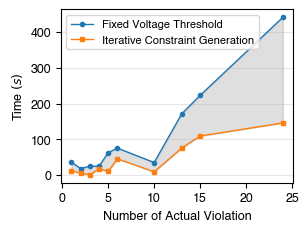

In [43]:
Vio_num_arr = np.array(Vio_num_list)
Time_fix = np.array([25.3, 223.1, 75.8, 36.7, 171.7, 25.2, 441.2, 35.6, 63.3, 18.7]) 
Time_gen = np.array([1.2, 109.6, 46, 12.3, 76.1, 18.2, 146.2, 9.6, 11, 6])

diff = Time_fix - Time_gen

order = np.argsort(Vio_num_list)


fig, ax1 = plt.subplots(figsize=(3, 2.25))

line1, = ax1.plot(
    Vio_num_arr[order], Time_fix[order],
    color="C0",
    linestyle="-",
    linewidth=1,
    marker="o",
    ms = 3,
    label="Fixed Voltage Threshold"
)

line2, = ax1.plot(
    Vio_num_arr[order], Time_gen[order],
    color="C1",
    linestyle="-",
    linewidth=1,
    marker="s",
    ms = 3,
    label="Iterative Constraint Generation"
)

ax1.fill_between(
    Vio_num_arr[order],
    Time_fix[order],
    Time_gen[order],
    alpha=0.25,
    color="grey",
    label="Time Difference"
)


ax1.set_xlabel("Number of Actual Violation")
ax1.set_ylabel("Time $(s)$")
ax1.grid(True, axis="y", alpha=0.3)


# Legend: only two entries
ax1.legend(
    handles=[line1, line2],
    loc="upper left",
    fontsize=8
)

#plt.savefig('fig_part1.pdf', dpi=300, bbox_inches='tight')
plt.show()


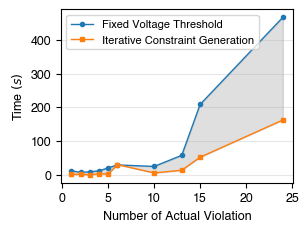

In [44]:
### Visualization

Vio_num_arr = np.array(Vio_num_list)
Time_fix = np.array(Time_list)
Time_gen = np.array(Time_list2)

diff = Time_fix - Time_gen

order = np.argsort(Vio_num_list)


fig, ax1 = plt.subplots(figsize=(3, 2.25))

line1, = ax1.plot(
    Vio_num_arr[order], Time_fix[order],
    color="C0",
    linestyle="-",
    linewidth=1,
    marker="o",
    ms = 3,
    label="Fixed Voltage Threshold"
)

line2, = ax1.plot(
    Vio_num_arr[order], Time_gen[order],
    color="C1",
    linestyle="-",
    linewidth=1,
    marker="s",
    ms = 3,
    label="Iterative Constraint Generation"
)

ax1.fill_between(
    Vio_num_arr[order],
    Time_fix[order],
    Time_gen[order],
    alpha=0.25,
    color="grey",
    label="Time Difference"
)


ax1.set_xlabel("Number of Actual Violation")
ax1.set_ylabel("Time $(s)$")
ax1.grid(True, axis="y", alpha=0.3)


# Legend: only two entries
ax1.legend(
    handles=[line1, line2],
    loc="upper left",
    fontsize=8
)

#plt.savefig('fig_part1.pdf', dpi=300, bbox_inches='tight')
plt.show()

# Results of Figure 3

Solve the measurement selection over 5 datasets (T = 1440, 5 days), refered as computation data

## Proposed Algorithm

In [38]:
### Arbitrarily select 10 datasets to evaluate the performance
dataset_num = 10

random.seed(18956)
index_list = random.sample(range(20), dataset_num)

index_list = sorted(index_list)
print(index_list)

[0, 1, 2, 3, 5, 6, 7, 9, 10, 11]


In [39]:
### Construct the computation and evaluation dataset (half-half)

random.seed(75)
indices = random.sample(range(dataset_num), 5)

index_list_train = [index_list[i] for i in sorted(indices)]
index_list_test = [index_list[i] for i in range(dataset_num) if i not in indices]

print(index_list_train)
print(index_list_test)

vv_arr = np.array(vv_list)

vv_train = np.concatenate([
    vv_arr[index * horizon_day : (index + 1) * horizon_day] 
    for index in index_list_train
])

[0, 6, 7, 9, 11]
[1, 2, 3, 5, 10]


In [40]:
### Solve for the measurement selection
margin_step = 0.005

result = constraint_generation_framework(
    A=BB,
    x_lb = x1,
    x_ub=x2,
    vv_list= vv_train,
    r=8,
    C_matrix=BB,
    v_min=-0.05,
    v_max=0.05,
    M_val=0.15,
    delta_l=margin_step,
    delta_u=margin_step,
    eps_l=0.0,
    eps_u=0.0,
    max_iter=10,
    tol_eq=1e-6,
    time_limit=1000,
    mip_gap=1e-4,
    verbose=True,
    optimality_check=False
)

selection_proposed = result["measurement_set"]
print(selection_proposed) # ~8min

Initial |R_l| = 11
Initial |R_u| = 32

Constraint-generation iteration 0
Set parameter Threads to value 8
Set parameter Seed to value 40
Selected measurements: [29, 33, 35, 43, 44, 46, 49, 50]
Objective value: 0.23394198661814064
Lower loss: 0.02849941968339084
Upper loss: 0.2054425669347498
Lower buffer upper bound: -0.045000000000000005
Upper buffer lower bound: 0.045000000000000005
Lower LPs checked: 40
Upper LPs checked: 49
New pairs for lower-limit: 2
New pairs for upper-limit: 5
|R_l|: 11 -> 13
|R_u|: 32 -> 37

Constraint-generation iteration 1
Set parameter Threads to value 8
Set parameter Seed to value 40
Selected measurements: [29, 32, 35, 38, 40, 44, 49, 50]
Objective value: 0.2367206792246667
Lower loss: 0.02953565659258344
Upper loss: 0.20718502263208324
Lower buffer upper bound: -0.04
Upper buffer lower bound: 0.04
Lower LPs checked: 224
Upper LPs checked: 115
New pairs for lower-limit: 0
New pairs for upper-limit: 0
|R_l|: 13 -> 13
|R_u|: 37 -> 37
No new pair is added in 

We note that the above measurement selection is slightly different from the one in the paper, where
selection_proposed = [29, 32, 35, 38, 43, 44, 49, 50]. But both achieve the same objective value. \
We attribute it to the non-convexity of problem and distinct seed parameter used in Gurobi solver.

## Box Alarm Region [Buason, 2024 EPSR]

In [45]:
def box_certificate_mea_placement_solve(
    A,
    C,
    x_lb,
    x_ub,
    r,
    vs_min,
    vs_max,
    v_min=-0.05,
    v_max=0.05,
    M=1.0,
    Gamma=1e3,
    time_limit=600,
    mip_gap=1e-4,
    verbose=True,
):
    """
    Solve the box-certificate measurement placement problem in [Buason, 2024 EPSR]

    Formulation:
        max sum_i s_i (vbar_s_i - vunder_s_i)

    subject to:
        1^T s = r
        s_i binary
        vbar_i = vbar_s_i s_i + M(1-s_i)
        vunder_i = vunder_s_i s_i - M(1-s_i)

        dual certificates for lower and upper voltage safety
        primal feasibility point x0

    Parameters
    ----------
    A : np.ndarray, shape (N, d)
        Voltage mapping matrix. Voltage vector is v = A x.

    C : np.ndarray, shape (N, d)
        Row c_i defines the target voltage quantity c_i^T x.

    x_lb, x_ub : np.ndarray, shape (d,)
        Lower and upper bounds of power variability range.

    r : int
        Number of measurement.

    v_min, v_max : float
        Voltage safety limits.

    M : float
        Big-M value for relaxing unselected voltage box constraints.

    Gamma : float
        Upper bound on dual variables for numerical stability.

    Returns
    -------
    result : dict
        Solution information.
    """

    A = np.asarray(A, dtype=float)
    C = np.asarray(C, dtype=float)
    x_lb = np.asarray(x_lb, dtype=float)
    x_ub = np.asarray(x_ub, dtype=float)

    N, d = A.shape
    assert C.shape == (N, d)
    assert x_lb.shape == (d,)
    assert x_ub.shape == (d,)

    model = gp.Model("Box_certificate_mea_placement")

    if not verbose:
        model.Params.OutputFlag = 0

    model.Params.TimeLimit = time_limit
    model.Params.MIPGap = mip_gap

    # Required because the formulation has bilinear terms.
    model.Params.NonConvex = 2

    # Helpful numerical settings.
    model.Params.MIPFocus = 1
    model.Params.Presolve = 2
    model.Params.Cuts = 2

    # -----------------------------
    # Upper-level variables
    # -----------------------------
    s = model.addMVar(N, vtype=GRB.BINARY, name="s")

    vbar_s = model.addMVar(N, lb=vs_min, ub=vs_max, name="vbar_s")
    vunder_s = model.addMVar(N, lb=vs_min, ub=vs_max, name="vunder_s")

    vbar = model.addMVar(N, lb=-M, ub=M, name="vbar")
    vunder = model.addMVar(N, lb=-M, ub=M, name="vunder")

    # Feasibility witness.
    x0 = model.addMVar(d, lb=x_lb, ub=x_ub, name="x0")

    # -----------------------------
    # Dual variables
    # -----------------------------
    alpha_l = model.addMVar((N, d), lb=0.0, ub=Gamma, name="alpha_l")
    beta_l  = model.addMVar((N, d), lb=0.0, ub=Gamma, name="beta_l")
    mu_l    = model.addMVar((N, N), lb=0.0, ub=Gamma, name="mu_l")
    eta_l   = model.addMVar((N, N), lb=0.0, ub=Gamma, name="eta_l")

    alpha_u = model.addMVar((N, d), lb=0.0, ub=Gamma, name="alpha_u")
    beta_u  = model.addMVar((N, d), lb=0.0, ub=Gamma, name="beta_u")
    mu_u    = model.addMVar((N, N), lb=0.0, ub=Gamma, name="mu_u")
    eta_u   = model.addMVar((N, N), lb=0.0, ub=Gamma, name="eta_u")

    # -----------------------------
    # Measurement budget
    # -----------------------------
    model.addConstr(s.sum() == r, name="measurement_budget")

    # Enforce valid local box width. (No need anymore)
    # model.addConstr(vbar_s >= vunder_s, name="valid_measurement_box")

    # -----------------------------
    # Big-M measured box construction
    # -----------------------------
    for i in range(N):
        model.addConstr(
            vbar[i] == vbar_s[i] * s[i] + M * (1 - s[i]),
            name=f"upper_box_{i}",
        )

        model.addConstr(
            vunder[i] == vunder_s[i] * s[i] - M * (1 - s[i]),
            name=f"lower_box_{i}",
        )

    # -----------------------------
    # Primal feasibility witness
    # -----------------------------
    Ax0 = A @ x0
    model.addConstr(Ax0 <= vbar, name="feas_upper_voltage")
    model.addConstr(Ax0 >= vunder, name="feas_lower_voltage")

    # -----------------------------
    # Lower-limit dual certificates
    # -----------------------------
    for i in range(N):

        # c_i + alpha_l - beta_l + A^T mu_l - A^T eta_l = 0
        for k in range(d):
            model.addConstr(
                C[i, k]
                + alpha_l[i, k]
                - beta_l[i, k]
                + gp.quicksum(A[j, k] * mu_l[i, j] for j in range(N))
                - gp.quicksum(A[j, k] * eta_l[i, j] for j in range(N))
                == 0,
                name=f"lower_dual_feas_{i}_{k}",
            )

        lower_dual_value = (
            -gp.quicksum(alpha_l[i, k] * x_ub[k] for k in range(d))
            + gp.quicksum(beta_l[i, k] * x_lb[k] for k in range(d))
            - gp.quicksum(mu_l[i, j] * vbar[j] for j in range(N))
            + gp.quicksum(eta_l[i, j] * vunder[j] for j in range(N))
        )

        model.addConstr(
            lower_dual_value >= v_min,
            name=f"lower_voltage_certificate_{i}",
        )

    # -----------------------------
    # Upper-limit dual certificates
    # -----------------------------
    for i in range(N):

        # alpha_u - beta_u + A^T mu_u - A^T eta_u = c_i
        for k in range(d):
            model.addConstr(
                alpha_u[i, k]
                - beta_u[i, k]
                + gp.quicksum(A[j, k] * mu_u[i, j] for j in range(N))
                - gp.quicksum(A[j, k] * eta_u[i, j] for j in range(N))
                == C[i, k],
                name=f"upper_dual_feas_{i}_{k}",
            )

        upper_dual_value = (
            gp.quicksum(alpha_u[i, k] * x_ub[k] for k in range(d))
            - gp.quicksum(beta_u[i, k] * x_lb[k] for k in range(d))
            + gp.quicksum(mu_u[i, j] * vbar[j] for j in range(N))
            - gp.quicksum(eta_u[i, j] * vunder[j] for j in range(N))
        )

        model.addConstr(
            upper_dual_value <= v_max,
            name=f"upper_voltage_certificate_{i}",
        )

    # -----------------------------
    # Objective: maximize certified measured-voltage box width
    # -----------------------------
    obj = gp.quicksum(
        s[i] * (vbar_s[i] - vunder_s[i])
        for i in range(N)
    )

    model.setObjective(obj, GRB.MAXIMIZE)

    model.optimize()

    result = {
        "status": model.Status,
        "status_name": status_name(model.Status),
        "objective": None,
        "selected_nodes": None,
        "s": None,
        "vbar_s": None,
        "vunder_s": None,
        "vbar": None,
        "vunder": None,
        "x0": None,
        "model": model,
    }

    if model.SolCount > 0:
        s_val = np.array(s.X)
        selected_nodes = np.where(s_val > 0.5)[0].tolist()

        result.update({
            "objective": model.ObjVal,
            "selected_nodes": selected_nodes,
            "s": s_val,
            "vbar_s": np.array(vbar_s.X),
            "vunder_s": np.array(vunder_s.X),
            "vbar": np.array(vbar.X),
            "vunder": np.array(vunder.X),
            "x0": np.array(x0.X),
        })

    return result


def status_name(status):
    mapping = {
        GRB.OPTIMAL: "OPTIMAL",
        GRB.INFEASIBLE: "INFEASIBLE",
        GRB.UNBOUNDED: "UNBOUNDED",
        GRB.INF_OR_UNBD: "INF_OR_UNBD",
        GRB.TIME_LIMIT: "TIME_LIMIT",
        GRB.SUBOPTIMAL: "SUBOPTIMAL",
    }
    return mapping.get(status, f"STATUS_{status}")

In [46]:
result = box_certificate_mea_placement_solve(
    A=BB,
    C=BB,
    x_lb=x1,
    x_ub=x2,
    r=8,
    vs_min=np.maximum(BB @ x1, -0.05 * np.ones(num_node)),
    vs_max=np.minimum(BB @ x2, 0.05 * np.ones(num_node)),
    v_min=-0.05,
    v_max=0.05,
    M=0.15,
    Gamma=1e3,
    time_limit=800,
    verbose=True,
)


print("Status:", result["status_name"])
print("Objective:", result["objective"])
print("Selected nodes:", result["selected_nodes"])
print("vunder_s:", result["vunder_s"])
print("vbar_s:", result["vbar_s"])

Set parameter TimeLimit to value 800
Set parameter MIPGap to value 0.0001
Set parameter NonConvex to value 2
Set parameter MIPFocus to value 1
Set parameter Presolve to value 2
Set parameter Cuts to value 2
Gurobi Optimizer version 13.0.2 build v13.0.2rc1 (mac64[arm] - Darwin 25.3.0 25D2128)

CPU model: Apple M1
Thread count: 8 physical cores, 8 logical processors, using up to 8 threads

Non-default parameters:
TimeLimit  800
MIPFocus  1
Cuts  2
NonConvex  2
Presolve  2

Optimize a model with 12211 rows, 36685 columns and 1367465 nonzeros (Max)
Model fingerprint: 0x695a7904
Model has 0 linear objective coefficients
Model has 110 quadratic objective terms
Model has 220 quadratic constraints
Variable types: 36630 continuous, 55 integer (55 binary)
Coefficient statistics:
  Matrix range     [1e-03, 1e+00]
  QMatrix range    [1e+00, 1e+00]
  QLMatrix range   [6e-03, 2e+00]
  Objective range  [0e+00, 0e+00]
  QObjective range [2e+00, 2e+00]
  Bounds range     [6e-03, 1e+03]
  RHS range     

In [47]:
### Record results
selection_box = result["selected_nodes"]
vunder_s = result["vunder_s"][selection_box]
vbar_s = result["vbar_s"][selection_box]

print(selection_box)
print(vunder_s)
print(vbar_s)

[25, 27, 28, 34, 35, 44, 45, 49]
[-0.05       -0.05       -0.05       -0.05       -0.05       -0.05
 -0.03867824 -0.05      ]
[0.05       0.05       0.05       0.05       0.05       0.05
 0.05       0.03757296]


In [55]:
### Results used in the paper
selection_box = [26, 29, 32, 35, 36, 44, 50, 51]
vunder_s = [-0.05, -0.05, -0.05, -0.03960555, -0.05, -0.05, -0.05, -0.05]
vbar_s = [0.05, 0.04974254, 0.05, 0.05, 0.05, 0.04438325, 0.05, 0.05]

We note that due to the non-convexity of the formulation for the box alarm region, different solutions may be obtained under the same code, without specifying the Thread and Seed in Gurobi model. But the relative performance to the proposed method and control groups are kept. For the consistent visualization, we explicitly illustrate the solutions used in the paper as follows. It can also be compared with reader's own results.

"selection_box = [26, 29, 32, 35, 36, 44, 50, 51]" 

"vunder_s = [-0.05,       -0.05,       -0.05,       -0.03960555, -0.05,       -0.05,
 -0.05,       -0.05      ]"

 "vbar_s = [0.05,       0.04974254, 0.05,       0.05,       0.05,       0.04438325,
 0.05,       0.05      ]".

 Here the time limit is reached with an optimality gap 2.08\%

## Control Group

We equally split the measurement budget for nodes with highest and lowest measured voltages

In [48]:
### Order the voltage measurement and observe the nodes with highest and lowest voltages

### Lower limit
vol_violation_nodescenario_low = {}

for index in index_list_train:
    for i in range(index * horizon_day, (index + 1)*horizon_day):
        for j in range(num_node):
            if vv_list[i][j] < -0.04:
                vol_violation_nodescenario_low[(j, i)] = vv_list[i][j]

print('*Lower limit*')
print(len(vol_violation_nodescenario_low))
#print(vol_violation_nodescenario_low)

sorted_low = dict(sorted(vol_violation_nodescenario_low.items(), key=lambda item: item[1]))
print(sorted_low)

### Upper limit
vol_violation_nodescenario_upp = {}

for index in index_list_train:
    for i in range(index * horizon_day, (index + 1)*horizon_day):
        for j in range(num_node):
            if vv_list[i][j] > 0.04:
                vol_violation_nodescenario_upp[(j, i)] = vv_list[i][j]

print('*Upper limit*')
print(len(vol_violation_nodescenario_upp))
#print(vol_violation_nodescenario_upp)

sorted_upp = dict(sorted(vol_violation_nodescenario_upp.items(), key=lambda item: item[1], reverse=True))
print(sorted_upp)

*Lower limit*
237
{(50, 2728): -0.0543700332991225, (35, 2728): -0.05421795767060159, (52, 2728): -0.0538123652595066, (46, 2728): -0.05320721729979301, (53, 2728): -0.052817196968900616, (54, 2728): -0.05262126187627106, (51, 2728): -0.052198358705480015, (49, 2728): -0.05179018785755367, (48, 2728): -0.05096202575162937, (35, 3348): -0.05062160270829579, (47, 2728): -0.05033671069349901, (38, 2728): -0.04986016846751181, (37, 2728): -0.04944694320078297, (35, 1876): -0.04944271784194899, (45, 2728): -0.04922692486383497, (36, 2728): -0.048415315846970924, (46, 3348): -0.04837188347268753, (50, 3439): -0.04820945722992599, (35, 2613): -0.047699916192569955, (35, 2075): -0.04747168795006203, (34, 2728): -0.04742824756082027, (52, 3439): -0.04741365152982606, (41, 2728): -0.04711632897948417, (52, 3348): -0.04688551523804687, (35, 1910): -0.046672983351750415, (53, 3439): -0.04662114400455442, (54, 3439): -0.046556369510276724, (46, 3439): -0.0464486835972331, (39, 2728): -0.04633056042

In [49]:
selection_control = np.array([35, 40, 42, 43, 44, 46, 50, 52])

## Evaluate the Performance of Measurement Selection (Figure 3b)

In [50]:
### Uncertifiable node-scenario pair under proposed method

info_list0_proposed = []
info_list1_proposed = []
nodescenario_list0_proposed = []
nodescenario_list1_proposed = []

for index in index_list_test:
    info_list0, info_list1, nodescenario_list0, nodescenario_list1 = vol_violation_full(selection_proposed, set_index=index)

    info_list0_proposed += info_list0
    info_list1_proposed += info_list1

    nodescenario_list0_proposed += nodescenario_list0
    nodescenario_list1_proposed += nodescenario_list1

### 44 mins (previously)
### 23 min (After using cp.Parameter to speed up)

Nodescenario pair (0, 288)
0
0
Nodescenario pair (0, 289)
0
0
Nodescenario pair (0, 290)
0
0
Nodescenario pair (0, 291)
0
0
Nodescenario pair (0, 292)
0
0
Nodescenario pair (0, 293)
0
0
Nodescenario pair (0, 294)
0
0
Nodescenario pair (0, 295)
0
0
Nodescenario pair (0, 296)
0
0
Nodescenario pair (0, 297)
0
0
Nodescenario pair (0, 298)
0
0
Nodescenario pair (0, 299)
0
0
Nodescenario pair (0, 300)
0
0
Nodescenario pair (0, 301)
0
0
Nodescenario pair (0, 302)
0
0
Nodescenario pair (0, 303)
0
0
Nodescenario pair (0, 304)
0
0
Nodescenario pair (0, 305)
0
0
Nodescenario pair (0, 306)
0
0
Nodescenario pair (0, 307)
0
0
Nodescenario pair (0, 308)
0
0
Nodescenario pair (0, 309)
0
0
Nodescenario pair (0, 310)
0
0
Nodescenario pair (0, 311)
0
0
Nodescenario pair (0, 312)
0
0
Nodescenario pair (0, 313)
0
0
Nodescenario pair (0, 314)
0
0
Nodescenario pair (0, 315)
0
0
Nodescenario pair (0, 316)
0
0
Nodescenario pair (0, 317)
0
0
Nodescenario pair (0, 318)
0
0
Nodescenario pair (0, 319)
0
0
Nodescen

In [51]:
print(len(info_list0_proposed))
print(len(info_list1_proposed))

print(np.sum(info_list0_proposed)+ np.sum(info_list1_proposed))

if len(info_list0_proposed) >0:
    print("Lower limit")
    print(np.max(info_list0_proposed))
if len(info_list1_proposed)>0:
    print("Lower limit")
    print(np.max(info_list1_proposed))

28
17
0.10540642561196795
Lower limit
0.006014394368930455
Lower limit
0.013816219932019341


In [57]:
### Uncertifiable node-scenario pair under box alarm region

info_list0_box = []
info_list1_box = []
nodescenario_list0_box = []
nodescenario_list1_box = []

for index in index_list_test:
    info_list0, info_list1, nodescenario_list0, nodescenario_list1 = vol_violation_full(selection_box, set_index=index)

    info_list0_box += info_list0
    info_list1_box += info_list1

    nodescenario_list0_box += nodescenario_list0
    nodescenario_list1_box += nodescenario_list1

### 40 mins (23min)

Nodescenario pair (0, 288)
0
0
Nodescenario pair (0, 289)
0
0
Nodescenario pair (0, 290)
0
0
Nodescenario pair (0, 291)
0
0
Nodescenario pair (0, 292)
0
0
Nodescenario pair (0, 293)
0
0
Nodescenario pair (0, 294)
0
0
Nodescenario pair (0, 295)
0
0
Nodescenario pair (0, 296)
0
0
Nodescenario pair (0, 297)
0
0
Nodescenario pair (0, 298)
0
0
Nodescenario pair (0, 299)
0
0
Nodescenario pair (0, 300)
0
0
Nodescenario pair (0, 301)
0
0
Nodescenario pair (0, 302)
0
0
Nodescenario pair (0, 303)
0
0
Nodescenario pair (0, 304)
0
0
Nodescenario pair (0, 305)
0
0
Nodescenario pair (0, 306)
0
0
Nodescenario pair (0, 307)
0
0
Nodescenario pair (0, 308)
0
0
Nodescenario pair (0, 309)
0
0
Nodescenario pair (0, 310)
0
0
Nodescenario pair (0, 311)
0
0
Nodescenario pair (0, 312)
0
0
Nodescenario pair (0, 313)
0
0
Nodescenario pair (0, 314)
0
0
Nodescenario pair (0, 315)
0
0
Nodescenario pair (0, 316)
0
0
Nodescenario pair (0, 317)
0
0
Nodescenario pair (0, 318)
0
0
Nodescenario pair (0, 319)
0
0
Nodescen

In [58]:
print(len(info_list0_box))
print(len(info_list1_box))

print(np.sum(info_list0_box)+ np.sum(info_list1_box))

if len(info_list0_box) >0:
    print("Lower limit")
    print(np.max(info_list0_box))
if len(info_list1_box)>0:
    print("Lower limit")
    print(np.max(info_list1_box))

37
20
0.12255224859664429
Lower limit
0.006014394368930455
Lower limit
0.013816219932019327


In [54]:
### Uncertifiable node-scenario pair under control group

info_list0_control = []
info_list1_control = []
nodescenario_list0_control = []
nodescenario_list1_control = []

for index in index_list_test:
    info_list0, info_list1, nodescenario_list0, nodescenario_list1 = vol_violation_full(selection_control, set_index=index)

    info_list0_control += info_list0
    info_list1_control += info_list1

    nodescenario_list0_control += nodescenario_list0
    nodescenario_list1_control += nodescenario_list1

### 49 mins (23min)

Nodescenario pair (0, 288)
0
0
Nodescenario pair (0, 289)
0
0
Nodescenario pair (0, 290)
0
0
Nodescenario pair (0, 291)
0
0
Nodescenario pair (0, 292)
0
0
Nodescenario pair (0, 293)
0
0
Nodescenario pair (0, 294)
0
0
Nodescenario pair (0, 295)
0
0
Nodescenario pair (0, 296)
0
0
Nodescenario pair (0, 297)
0
0
Nodescenario pair (0, 298)
0
0
Nodescenario pair (0, 299)
0
0
Nodescenario pair (0, 300)
0
0
Nodescenario pair (0, 301)
0
0
Nodescenario pair (0, 302)
0
0
Nodescenario pair (0, 303)
0
0
Nodescenario pair (0, 304)
0
0
Nodescenario pair (0, 305)
0
0
Nodescenario pair (0, 306)
0
0
Nodescenario pair (0, 307)
0
0
Nodescenario pair (0, 308)
0
0
Nodescenario pair (0, 309)
0
0
Nodescenario pair (0, 310)
0
0
Nodescenario pair (0, 311)
0
0
Nodescenario pair (0, 312)
0
0
Nodescenario pair (0, 313)
0
0
Nodescenario pair (0, 314)
0
0
Nodescenario pair (0, 315)
0
0
Nodescenario pair (0, 316)
0
0
Nodescenario pair (0, 317)
0
0
Nodescenario pair (0, 318)
0
0
Nodescenario pair (0, 319)
0
0
Nodescen

In [56]:
print(len(info_list0_control))
print(len(info_list1_control))

print(np.sum(info_list0_control)+ np.sum(info_list1_control))

if len(info_list0_control) >0:
    print("Lower limit")
    print(np.max(info_list0_control))
if len(info_list1_box)>0:
    print("Lower limit")
    print(np.max(info_list1_control))

65
42
0.2678665658337225
Lower limit
0.007654772888319054
Lower limit
0.013816219932019327


In [59]:
###  Node-scenario pairs with actual violation

### Lower limit
vol_violation_nodescenario_low = {}

for index in index_list_test:
    for i in range(index * horizon_day, (index + 1)*horizon_day):
        for j in range(num_node):
            if vv_list[i][j] < -0.05:
                vol_violation_nodescenario_low[(j, i)] = vv_list[i][j]

print('*Lower limit*')
print(len(vol_violation_nodescenario_low))

nodescenario_list0_actual = list(vol_violation_nodescenario_low.keys())
nodescenario_list0_actual = [list(x) for x in nodescenario_list0_actual]


### Upper limit
vol_violation_nodescenario_upp = {}

for index in index_list_test:
    for i in range(index * horizon_day, (index + 1)*horizon_day):
        for j in range(num_node):
            if vv_list[i][j] > 0.05:
                vol_violation_nodescenario_upp[(j, i)] = vv_list[i][j]

print('*Upper limit*')
print(len(vol_violation_nodescenario_upp))

nodescenario_list1_actual = list(vol_violation_nodescenario_upp.keys())
nodescenario_list1_actual = [list(x) for x in nodescenario_list1_actual]


*Lower limit*
23
*Upper limit*
17


In [60]:
### Assign to each test dataset
num_nodescenario_proposed = []
num_nodescenario_box = []
num_nodescenario_control = []
num_nodescenario_actual = []

for index in index_list_test:
    bin1 = [x for x in nodescenario_list0_actual if index * horizon_day <= x[1] < (index + 1) *horizon_day]
    bin2 = [x for x in nodescenario_list1_actual if index * horizon_day <= x[1] < (index + 1) *horizon_day]

    print("Actual Violation")
    print(len(bin1) + len(bin2))
    num_nodescenario_actual.append(len(bin1) + len(bin2))

    bin1 = [x for x in nodescenario_list0_proposed if index * horizon_day <= x[1] < (index + 1) *horizon_day]
    bin2 = [x for x in nodescenario_list1_proposed if index * horizon_day <= x[1] < (index + 1) *horizon_day]

    print("Proposed Method")
    print(len(bin1) + len(bin2))
    num_nodescenario_proposed.append(len(bin1) + len(bin2))

    bin1 = [x for x in nodescenario_list0_box if index * horizon_day <= x[1] < (index + 1) *horizon_day]
    bin2 = [x for x in nodescenario_list1_box if index * horizon_day <= x[1] < (index + 1) *horizon_day]

    print("Box Alarm Region")
    print(len(bin1) + len(bin2))
    num_nodescenario_box.append(len(bin1) + len(bin2))

    bin1 = [x for x in nodescenario_list0_control if index * horizon_day <= x[1] < (index + 1) *horizon_day]
    bin2 = [x for x in nodescenario_list1_control if index * horizon_day <= x[1] < (index + 1) *horizon_day]

    print("Control Group")
    print(len(bin1) + len(bin2))
    num_nodescenario_control.append(len(bin1) + len(bin2))


Actual Violation
15
Proposed Method
17
Box Alarm Region
19
Control Group
42
Actual Violation
6
Proposed Method
8
Box Alarm Region
10
Control Group
18
Actual Violation
1
Proposed Method
1
Box Alarm Region
2
Control Group
6
Actual Violation
13
Proposed Method
13
Box Alarm Region
20
Control Group
27
Actual Violation
5
Proposed Method
6
Box Alarm Region
6
Control Group
14


## Draw Figure 3(b)

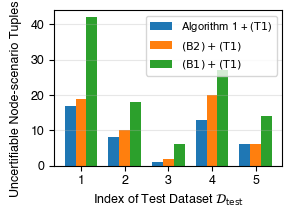

In [61]:
xx = np.arange(1, 6)

bar_width = 0.25

fig, ax = plt.subplots(figsize=(3, 2.25))

ax.bar(
    xx - bar_width,
    num_nodescenario_proposed,
    width=bar_width,
    color="C0",
    label=r"Algorithm 1 + ($\mathsf{T 1}$)"
)

ax.bar(
    xx,
    num_nodescenario_box,
    width=bar_width,
    color="C1",
    label=r"$(\mathsf{B2})+(\mathsf{T1})$"
)

ax.bar(
    xx + bar_width,
    num_nodescenario_control,
    width=bar_width,
    color="C2",
    label=r"$(\mathsf{B1})+(\mathsf{T1})$"
)

ax.set_xlabel(r"Index of Test Dataset $\mathcal{D}_{\mathrm{test}}$")
ax.set_ylabel("Uncertifiable Node-scenario Tuples")
# x_pos, y_pos = ax.yaxis.get_label().get_position()

ax.yaxis.set_label_coords(-0.14, 0.43)
ax.set_xticks(xx)
ax.legend(fontsize=8)
ax.grid(True, axis="y", alpha=0.3)

plt.tight_layout()
#plt.savefig('fig_part2-2_new.pdf', dpi=300, bbox_inches='tight')
plt.show()


## Draw Figure 3(a)

In [62]:
### Uncertifiable scenario under proposed method and scenario with actual violation
num_scenario_proposed = []
num_scenario_actual = []

for index in index_list_test:

    bin1 = [x for x in nodescenario_list0_actual if index * horizon_day <= x[1] < (index + 1) *horizon_day]
    bin2 = [x for x in nodescenario_list1_actual if index * horizon_day <= x[1] < (index + 1) *horizon_day]

    bin_total = bin1 + bin2
    
    scenario_list = np.array(bin_total)[:, 1]
    scenario_list = np.unique(scenario_list)
    num_scenario_actual.append(len(scenario_list))

    bin1 = [x for x in nodescenario_list0_proposed if index * horizon_day <= x[1] < (index + 1) *horizon_day]
    bin2 = [x for x in nodescenario_list1_proposed if index * horizon_day <= x[1] < (index + 1) *horizon_day]

    bin_total = bin1 + bin2
    
    scenario_list = np.array(bin_total)[:, 1]
    scenario_list = np.unique(scenario_list)
    num_scenario_proposed.append(len(scenario_list))

In [63]:
### Uncertifiable scenario under box alarm region
num_scenario_box = []

for index in index_list_test:
    scenario_list = []
    for t in list(range(index * horizon_day, (index + 1)*horizon_day)):
        vv_test = np.array(vv_list)[t][selection_box]
        flag = 0
        for i in range(len(vv_test)):
            if vv_test[i] < vunder_s[i] or vv_test[i] > vbar_s[i]:
                flag = 1
        if flag ==1:
            scenario_list.append(t)    
            
    num_scenario_box.append(len(scenario_list))


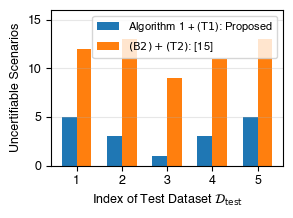

In [64]:
xx = np.arange(1, 6)

bar_width = 0.33

fig, ax = plt.subplots(figsize=(3, 2.25))

ax.bar(
    xx - bar_width / 2,
    num_scenario_proposed,
    width=bar_width,
    color="C0",
    label=r"Algorithm 1 + ($\mathsf{T1}$): Proposed"
)

ax.bar(
    xx + bar_width / 2,
    num_scenario_box,
    width=bar_width,
    color="C1",
    label=r"$(\mathsf{B 2})+(\mathsf{T2})$: [15]"
)


ax.set_xlabel(r"Index of Test Dataset $\mathcal{D}_{\mathrm{test}}$")
ax.set_ylabel("Uncertifiable Scenarios")
ax.set_xticks(xx)
ax.set_ylim([0, 16])
ax.legend(fontsize=8)
ax.grid(True, axis="y", alpha=0.3)

plt.tight_layout()
#plt.savefig('fig_part2-1_new.pdf', dpi=300, bbox_inches='tight')
plt.show()


## Draw Figure 4

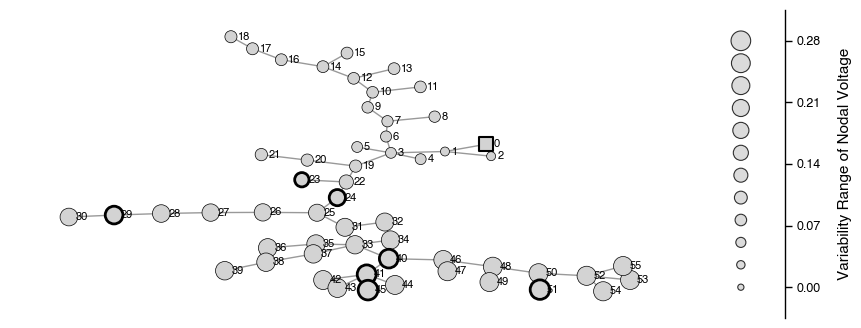

In [ ]:
import networkx as nx
from mpl_toolkits.axes_grid1 import make_axes_locatable

tol = 1e-4

# =========================
# Compute voltage variability
# =========================
vv_variablity = BB @ (x2 - x1)
vv_variablity = np.insert(vv_variablity, 0, 0)

pv_pos = np.array([22, 23, 28, 39, 40, 44, 50])
# pv_pos = np.array([44])
pv_nodes = pv_pos + 1

# =========================
# Create figure
# =========================
fig, ax = plt.subplots(figsize=(10, 4))

# =========================
# 1. Create graph
# =========================
G = nx.Graph()
G.add_nodes_from(range(num_node + 1))

# =========================
# 2. Obtain edge list
# =========================
edges = []

for i in range(num_node + 1):
    for j in range(i + 1, num_node + 1):
        if np.abs(np.real(YY)[i, j]) >= tol:
            edges.append((i, j))

G.add_edges_from(edges)

# =========================
# 3. Generate graph layout
# =========================
pos = nx.kamada_kawai_layout(G)
# pos = nx.spectral_layout(G)

# =========================
# 4. Draw edges
# =========================
nx.draw_networkx_edges(
    G,
    pos,
    ax=ax,
    alpha=0.8,
    edge_color='gray'
)

# =========================
# 5. Map voltage variability to node size
# =========================
node_order = np.arange(num_node + 1)

size_values = np.asarray(vv_variablity, dtype=float)

# If vv_variablity may contain both positive and negative values
# and the magnitude of variability is of interest, use:
# size_values = np.abs(np.asarray(vv_variablity, dtype=float))

min_size = 20
max_size = 200

vmin = np.min(size_values)
vmax = np.max(size_values)

if vmax == vmin:
    node_sizes = np.full_like(size_values, 120, dtype=float)
else:
    node_sizes = min_size + (
        (size_values - vmin) / (vmax - vmin)
    ) * (max_size - min_size)

# =========================
# 6. Draw normal nodes
# =========================
nx.draw_networkx_nodes(
    G,
    pos,
    ax=ax,
    nodelist=node_order,
    node_size=node_sizes[node_order],
    node_color='lightgray',
    edgecolors='black',
    linewidths=0.5
)

# =========================
# 7. Highlight PV nodes
# =========================
nx.draw_networkx_nodes(
    G,
    pos,
    ax=ax,
    nodelist=pv_nodes,
    node_size=node_sizes[pv_nodes],
    node_color='lightgray',
    edgecolors='black',
    linewidths=2
)

# =========================
# 8. Highlight slack bus
# =========================
nx.draw_networkx_nodes(
    G,
    pos,
    ax=ax,
    nodelist=[0],
    node_shape='s',
    node_color='lightgray',
    node_size=max(node_sizes[0], 100),
    edgecolors='black',
    linewidths=1.5
)

# =========================
# 9. Bubble-size scale bar with shaded circles
# =========================
divider = make_axes_locatable(ax)
size_ax = divider.append_axes("right", size="10%", pad=0.28)

# Number of circles in the scale bar
# A larger value gives a denser bubble scale
num_scale_points = 12

# Bubble values from minimum to maximum variability
scale_vals = np.linspace(vmin, vmax, num_scale_points)

if vmax == vmin:
    scale_sizes = np.full_like(scale_vals, 120, dtype=float)
else:
    scale_sizes = min_size + (
        (scale_vals - vmin) / (vmax - vmin)
    ) * (max_size - min_size)

# Control the vertical spacing of the bubbles
# A smaller difference between y_min and y_max gives denser bubbles
y_min = 0.1
y_max = 0.9

if vmax == vmin:
    y_pos = np.full_like(scale_vals, 0.5, dtype=float)
else:
    y_pos = y_min + (
        (scale_vals - vmin) / (vmax - vmin)
    ) * (y_max - y_min)

x_pos = np.full_like(y_pos, 0.35)

# Draw shaded circles
size_ax.scatter(
    x_pos,
    y_pos,
    s=scale_sizes,
    facecolors='lightgray',
    edgecolors='black',
    linewidths=0.8,
    alpha=0.8,
    clip_on=False
)

for node in G.nodes():
    x, y = pos[node]

    ax.annotate(
        str(node),
        xy=(x, y),
        xytext=(5, 0),          # offset: 5 points to the right
        textcoords='offset points',
        ha='left',
        va='center',
        fontsize=8,
        color='black'
    )


# =========================
# Add tick labels using fewer values
# =========================
num_ticks = 5
tick_vals = np.linspace(vmin, vmax, num_ticks)

if vmax == vmin:
    tick_y = np.full_like(tick_vals, 0.5, dtype=float)
else:
    tick_y = y_min + (
        (tick_vals - vmin) / (vmax - vmin)
    ) * (y_max - y_min)

size_ax.set_xlim(0, 1)
# size_ax.set_ylim(y_min, y_max)
size_ax.set_ylim(0, 1)

size_ax.set_xticks([])
size_ax.set_yticks(tick_y)
size_ax.set_yticklabels([f'{v:.2f}' for v in tick_vals])

size_ax.yaxis.tick_right()
size_ax.yaxis.set_label_position("right")

size_ax.set_ylabel(
    'Variability Range of Nodal Voltage',
    rotation=90,
    labelpad=12,
    fontsize=11
)

size_ax.tick_params(
    axis='y',
    labelsize=9,
    length=5,
    width=1
)


# Keep only the right vertical spine
for spine in ['top', 'left', 'bottom']:
    size_ax.spines[spine].set_visible(False)

size_ax.spines['right'].set_visible(True)
size_ax.spines['right'].set_linewidth(1.0)

# =========================
# 10. Remove axes and save figure
# =========================
ax.set_axis_off()
ax.set_frame_on(False)

# plt.savefig(
#     'fig7-1.pdf',
#     dpi=300,
#     bbox_inches='tight',
#     pad_inches=0.12
# )

# plt.savefig(
#     'fig_part3.svg',
#     format='svg',
#     bbox_inches='tight',
#     pad_inches=0.12
# )

plt.show()

The remaining part is completed through Figma (visualization design tool)

We note that the node order is slightly different to Figure 4 in the paper. But all results of measurement selection are strictly matched. We attribute this to the setup of nx.kamada_kawai_layout(G), which computes node positions by solving a layout optimization problem and does not tie the positions to the physical bus numbering.